| Task contribution                | Jonas (%) | Alexander (%) |
|---------------------|-----------|----------------|
| Dataset             | 60        | 40             |
| NLP              | 40       |   60              |
| Preprocessing        | 60        | 40             |
| Network               | 40        | 60             |
| Analysis community    | 60        | 40             |
| Analysis global       | 40        | 60             |

In [24]:
# Modules
import pandas as pd
import random
import re
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import spacy
from spacy import displacy
import dacy
import json
import netwulf
import networkx as nx

# Imports
from nlp_utils import *
from pathlib import Path
import powerlaw
from network_utils import louvain_based_communities_randomized
from networkx import edge_boundary
from difflib import SequenceMatcher
from sklearn.feature_extraction.text import TfidfVectorizer
from collections import defaultdict, Counter
from wordcloud import WordCloud
import os

# Configuration
spacy.require_gpu() # run SpaCy GPU-accelerated
sns.set_theme()

# Ignore warnings for prettier output
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=UserWarning)

## 💡 Introduction and Motivation

Being a celebrity also means being a public person. which means being constantly in the limelight, and much of what they do is documented and shared by the media. It is still known today that theres a gender differnence in news articles. In this project we will highlight gender specific language in news articles. 

## 🗂️ Dataset

While we wanted to do much of the data collection ourselves, we faced numerous challenges. First, newspaper articles are intellectual properties owned by the author and/or the newspaper outlet, and so naturally we do not want to face any legal challenges by using them in our research without their consent. Secondly, during a pilot study we ran into rate limiting issues while scraping articles using various search engines, not to mention the bias that search engines would pose on the articles we'd actually collect from them.

To direct our focus on datasets that weren't infeasible wrt. size, we decided to look at Danish national newspapers. We came across [EB-NeRD](https://recsys.eb.dk/), which is a dataset comprising of 125,000+ articles spanning from 1993-2023.

> NOTE: Due to the license of EB-NERD we may not share the dataset, you will have to download yourself and accept their terms and conditions. 

> License disclaimer: The use of EB-nerd is purely educational in this project by applying social science methods on it, we are not using it to derive any product such as LLM training. 

Below is a snippet of the dataset imported as a `pandas` DataFrame, showing only the relevant columns:

In [8]:
# Load dataset
df_articles = pd.read_parquet("dataset/articles.parquet")

# Remove empty articles
df_articles = df_articles[df_articles["body"].str.strip().astype(bool)].copy()

# Columns
for c in df_articles.columns:
    print(c)

article_id
title
subtitle
last_modified_time
premium
body
published_time
image_ids
article_type
url
ner_clusters
entity_groups
topics
category
subcategory
category_str
total_inviews
total_pageviews
total_read_time
sentiment_score
sentiment_label


## 📶 Pre-Processing and Overview

We firstly take can look at the proportion of articles from each category to see what they prefer to write about:

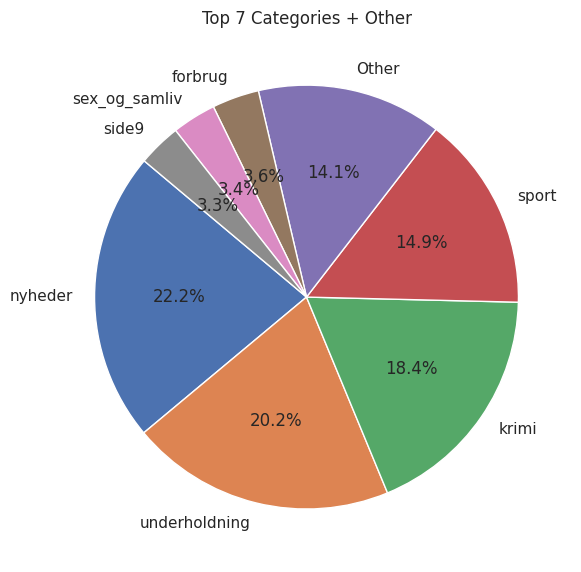

In [17]:
# Count categories
category_counts = df_articles['category_str'].value_counts()

# Top 5 categories
top_categories = category_counts.nlargest(7)

# Replace all other categories with 'Other'
df_articles['category_grouped'] = df_articles['category_str'].where(df_articles['category_str'].isin(top_categories.index), 'Other')

# Re-count including 'Other'
grouped_counts = df_articles['category_grouped'].value_counts()

# Plot pie chart
plt.figure(figsize=(6, 6))
grouped_counts.plot.pie(autopct='%1.1f%%', startangle=140)
plt.title('Top 7 Categories + Other')
plt.ylabel('')
plt.tight_layout()
plt.savefig("website/figures/category-pie-chart.svg")
plt.show()

and a $\log$-normalized timeline of the number of articles per month, for each category:

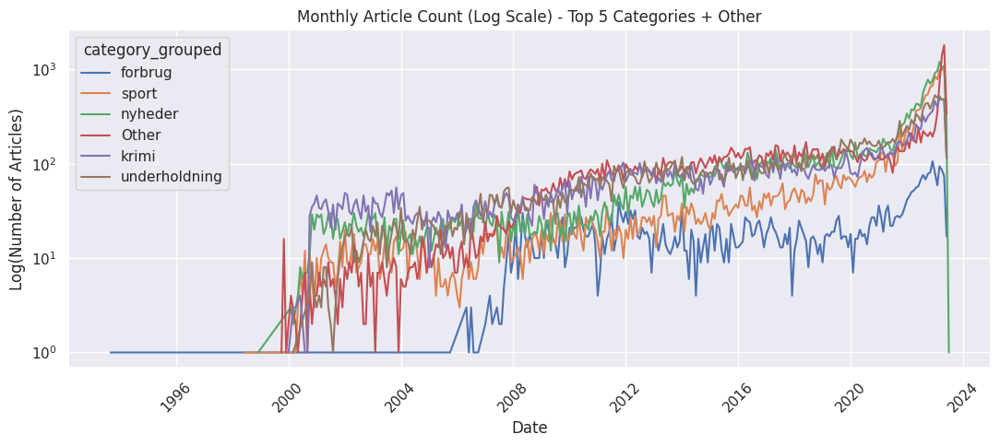

In [16]:
# Ensure 'published_time' is datetime
df_articles['published_time'] = pd.to_datetime(df_articles['published_time'])

# Create 'year_month' column for grouping
df_articles['year_month'] = df_articles['published_time'].dt.to_period('M').astype(str)

# Use the previously grouped categories (top 5 + 'Other')
category_counts = df_articles['category_str'].value_counts()
top5_categories = category_counts.nlargest(5).index
df_articles['category_grouped'] = df_articles['category_str'].where(df_articles['category_str'].isin(top5_categories), 'Other')

# Group by year_month and grouped category
monthly_counts_grouped = df_articles.groupby(['year_month', 'category_grouped']).size().reset_index(name='count')

# Convert year_month back to datetime for plotting
monthly_counts_grouped['year_month'] = pd.to_datetime(monthly_counts_grouped['year_month'])

# Plot the timeline
plt.figure(figsize=(11, 5))
sns.lineplot(data=monthly_counts_grouped, x='year_month', y='count', hue='category_grouped')
plt.yscale('log')  # Apply log scale
plt.title('Monthly Article Count (Log Scale) - Top 5 Categories + Other')
plt.xlabel('Date')
plt.ylabel('Log(Number of Articles)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("website/figures/monthly-article-count.svg")
plt.show()

### Subset Entertainment

From here on out we will only consider a subset of the DataFrame and limit ourselves to the `underholdning` (english: entertainment) category, which comprises over 20% of the dataset as shown above.

In [18]:
# Entertainment-only DataFrame
df = df_articles[df_articles["category_str"] == "underholdning"]

# Number of articles
print(len(df))

24191


## 🌐 Natural Language Processing (NLP)

A news article dataset without any noteworthy features/attributes is essentially useless, so we needed a way to generate features, so that we can perform proper quantitative analysis.

To achieve this in machine learning fashion, we used NLP in the form of [`SpaCy`](https://spacy.io/), specifically the Danish module [`DaCy`](https://centre-for-humanities-computing.github.io/DaCy/), since it enables Danish language processing pipelines and is currently the [best performing](https://centre-for-humanities-computing.github.io/DaCy/performance.general.html) model on all relevant tasks. We employ the large transformer model and leverage GPU acceleration for optimal speed and accuracy.

We were mainly interested in the following features:
- **Named Entity Recognition (NER):** To find entities, in this case persons and their associated names, in the articles.
- **Parts-of-speech tagging (POS):** To find descriptive words (mainly nouns and adjectives) for the detected entities.
- **Dependency Parsing:** To link NER to POS and properly assign the right words to the right entities, on a per-sentence basis.
- **Lemmatization:** To reduce names and words to their base form (e.g. "kan" becomes "kunne" and "Mikkelsen's" becomes "Mikkelsen").
- **Coreference Resolution:** To find expressions, mainly pronouns, that refer to the same entity in a text.
- **Sentiment Analysis:** In the form of polarity to determine if an article is deemed `positive`, `neutral` or `negative`.
- **Emotion Detection:** To classify the kind of emotion(s) found in an article, given that it is emotionally laden.
- **Hate Speech Detection:** To classify whether an article is deemed offensive or not.

The entire NLP pipeline can be found in `nlp.py`, but to build intuition let's have a look at most central parts of the pipeline, what they effectively do and what results they enable us to achieve.

Programatically, the pipeline looks like this:

In [19]:
# Load large DaCy model and add NLP components to pipeline
nlp = dacy.load("large")                       # Loads transformer model (incl. NER, coref, lemmatizer, POS tagger)
nlp.add_pipe("dacy/polarity")                  # Add sentiment analysis, polarity
nlp.add_pipe("dacy/emotionally_laden")         # Add emotion detection
nlp.add_pipe("dacy/emotion")                   # Add emotion classification
nlp.add_pipe("dacy/hatespeech_detection")      # Add hate speech detection
nlp.add_pipe("dacy/hatespeech_classification") # Add hate speech classification

Sample a few articles to parse through the NLP pipeline:

In [20]:
# Sample using seed = 42
sample_df = df.sample(n=3, random_state=42).copy()

# Get article body texts as list
texts = sample_df["body"].tolist()

Extract exemplary sentences from the article texts:

In [28]:
def extract_sentences(text, num_sentences=5, seed=None):
    if seed is not None:
        random.seed(seed)

    sentences = re.split(r'(?<=[.!?])\s+', text) # Split into sentences using regex
    
    sentences = [s.strip() for s in sentences if len(s.strip()) > 10] # Filter out empty or very short sentences
    
    sampled = random.sample(sentences, min(num_sentences, len(sentences))) # Sample randomly from the sentences
    
    return sampled[0]

In [29]:
# Sample one sentence from each article in a list
seed = 19
text_sents = [extract_sentences(text, 1, seed) for text in texts]

In [57]:
# Pipe article-texts to make a generator object
sents = nlp.pipe(text_sents)
sent1 = nlp(text_sents[0])

docs = nlp.pipe(texts)

### Named Entity Recognition (NER)

Below is an illustration of named entity recognition for the sampled sentences in each of the three sampled articles:

In [47]:
for doc in sents:
    displacy.render(doc, style="ent")
    print("----------")

----------


----------


----------


Here we observe that `Lily-Rose Depp`, `Abel '`, `Nina Agdal` and `Logan Paul` are all labelled as persons (`PER`). This is precisely how we extract persons (later used as nodes) from articles (which act as edges).

E.g. in this case, `Lily-Rose Depp` and `Abel '` would each share an edge with one another in the first shown article from the sample.

### Dependency Parsing

We make use of dependency parsing to extract adjectives (`ADJ`) and noun (`NOUN`) modifiers associated with a person (`PER`) in a sentence. This is best illustrated with an example:

In [53]:
for doc in sents:
    displacy.render(doc, style="dep")

This is integral to the `find_descriptions` function (see `nlp_utils.py`), which:
1. iterates over the sentences in a document (article)
2. finds persons (entity label = `PER`)
3. for each token within the person span:
    - looks at its `children` in the depdendency tree
    - if a child is an adjective (`amod`) or an apposition (`appos`), or its part of the speech is `ADJ` or `NOUN` (but it's not a `PER` entity itself), it's considered a descriptive word and stored.
    - it will also check the token's `head` (governing word) for similar patterns

They are stored in their lemmatized and lowercased form.

For the sentences above, we can extract the following descriptive words:

In [56]:
for doc in sents:
    print(find_descriptions(doc))

defaultdict(<class 'list'>, {'Lily-Rose Depp': ['max-serie'], "Abel '": ['hovedrolle']})
defaultdict(<class 'list'>, {'Nina Agdal': ['trusse', '\n', 'frækk', 'dansk', 'topmodel']})
defaultdict(<class 'list'>, {'Logan Paul': ['amerikansk', 'youtuber']})


From here we gather that:
- Lily-Rose Depp is associated with "max-serie" (Max-series)
- Abel has the "hovedrolle" (leading role)
- Nina Agdal is associated with terms such as "trusse" (panties), "fræk" (hot), "dansk" (danish) and "topmodel".
- Logan Paul is associated with terms "amerikansk" (american) and "youtuber"

### Coreference Resolution

Since we also want to genderize the persons (`PER`) we find, we make use of coreference resolution which is the task of gathering all expressions associated with the same entity in a document. Luckily these expressions mainly consist of pronouns, which allow us to weigh male vs. female pronouns against each other for a given person's first name. Doing this on a global basis allow us to pool pronouns associated with a specific first name (e.g. "Camilla") and then sum the amount of times "Camilla" is associated with a male pronoun and a female pronoun, respectively. Whichever has the largest sum, the corresponding gender is assigned to said person. Then all the persons with first-name "Camilla" is assigned to that gender.

The male pronouns are:
- "ham" (him)
- "han" (he)
- "hans" (his)

The female pronouns are:
- "hun" (she)
- "hende" (her)
- "hendes" (hers)

Naturally, this has the drawback of not considering non-binary genders, and also possibly mis-labelling gender-neutral names (e.g. "Alex").

We show this in action using an example:

In [22]:
for doc in docs:
    for key, span_group in doc.spans.items():
        print(f"{key}: {span_group}")
    print()

Token indices sequence length is longer than the specified maximum sequence length for this model (550 > 512). Running this sequence through the model will result in indexing errors


coref_clusters_1: [instruktøren, han]
coref_clusters_2: [Ny HBO Max-serie, Max-serien, den, serien, serien, serien]
coref_clusters_3: ['The Idol', ''The Idol']
coref_clusters_4: [Lily-Rose Depp, Lily-Rose Depps, Lily-Rose Depps, hendes, 'The Idol', Depp, Depps, Depps, hun, 'The Idol', hende, Jocelyn, hun, sig selv, hun, hun, Hendes, seriens, Lily, hun, sig selv, hende, hun, hun, er, hende, sin, Sam Levinson, Rolling Stone, hende, The Idol']
coref_clusters_5: [Times' film-reporter Kyle Buchanan, sin, dig, Tesfaye, mediet, Lily- Rose Depp, Rose Depp, sin, hendes, hun, Jocelyn, hende, hun, dig, Jocelyn, LA Times, han, hans, Sam Levinson, 'Euphoria'-skaber Sam Levinson, han, Sam Levinson, Sam Levinson, Jocelyn, jeg, magasinet, Sam Levinson, han, du]
coref_clusters_6: [at der vises en scene, det, Det]
coref_clusters_7: [Lily-Rose Depps krop, showet, det, sig selv, sig]
coref_clusters_8: [glimt af potentiale, sexscenerne mellem Depp og Tesfaye, der, dem]
coref_clusters_9: [popstjernen Jocely

In the coreference resolution clusters above, it makes it easy to e.g. label "Lily-Rose" and "Nina" as female names and "Logan" as a male name.

### Sentiment Analysis

A quick look at polarity:

In [58]:
for doc in docs:
    print(doc._.polarity)
    print(doc._.polarity_prob)

Token indices sequence length is longer than the specified maximum sequence length for this model (550 > 512). Running this sequence through the model will result in indexing errors


neutral
{'prob': array([0.007, 0.989, 0.004], dtype=float32), 'labels': ['positive', 'neutral', 'negative']}
neutral
{'prob': array([0.109, 0.882, 0.009], dtype=float32), 'labels': ['positive', 'neutral', 'negative']}
neutral
{'prob': array([0.066, 0.933, 0.002], dtype=float32), 'labels': ['positive', 'neutral', 'negative']}


### NLP Dataset

The full pipeline found in `nlp.py` makes use of chunking to avoid loss of data upon out-of-memory and similar errors. The default NLP-pipe uses a batch size of 128, so it was only natural to do chunking in size of 256 which means two batches per chunk.

Running `nlp.py` outputs $\lceil 24191 / 256 \rceil = 95$ chunks which are saved as `parquet` files. The files are then combined into a single `parquet` file after the fact. Let's have a look at it:

In [59]:
# Load the processed dataset
df = pd.read_parquet("dataset/articles_entertainment_nlp.parquet")

# Apply JSON loads to mitigate empty clusters (an issue pertained to parquet saved using PyArrow)
df["coref_clusters"] = df["coref_clusters"].apply(json.loads)
df["person_descriptions"] = df["person_descriptions"].apply(json.loads)


# Relevant columns
include_col = ["article_id", "title", "subtitle", "body", "published_time", "ner_clusters", "entity_groups", "category_str", "sentiment_score", "sentiment_label", "ner_clusters_lemma", "coref_clusters", "emotion", "hate_speech", "person_descriptions"]

include_col

['article_id',
 'title',
 'subtitle',
 'body',
 'published_time',
 'ner_clusters',
 'entity_groups',
 'category_str',
 'sentiment_score',
 'sentiment_label',
 'ner_clusters_lemma',
 'coref_clusters',
 'emotion',
 'hate_speech',
 'person_descriptions']

---

## 🪪 Person Name Processing 

### Alias Assignment

We need to take into account that a person can be known under multiple identities or aliases. This can be anything from a nickname to an abbreviation or shortening of the original name, and even a misspelled variant of the name. E.g.: "Mads Mikkelsen" may be referred to as "Mads", "Mikkelsen" or "Mads Mikkelsen" in articles related to him.

This will allow us to gather information from coreference resolution clusters and person descriptions using their canonical name as well as their aliases. To speed up computations, we make a new column where we collect the lemmatized variants of person names and remove duplicates by converting the NER cluster to a set:

In [60]:
# Make a new persons column
df['persons'] = df.apply(
    lambda row: list(set(
        entity 
        for entity, group 
        in zip(row['ner_clusters_lemma'], row['entity_groups']) 
        if group == 'PER'
    )), # make a set
    axis=1
)

# To see the difference between this and the regular NER cluster
print(df["persons"].iloc[0])
print()
print(df["ner_clusters"].iloc[0])

['Tom Hanks', 'David Gardner', 'Lewes', 'Samantha Lewes', 'Hanks', 'Samantha']

['Tom Hanks' 'Samantha Lewes' 'David Gardner' 'Samantha' 'Hanks'
 'Samantha Lewes' 'SFGate.com' 'Hanks' 'Lewes' 'Tom Hanks'
 'Samantha Lewes']


To get rid of incorrectly classified persons, we run it through a simple algorithm found in `nlp_utils.py`:

**Examples:**
   - "_Tom hanks$" → "Tom hanks"
   - "A$Ap Rocky" → "A$Ap Rocky" (preserves internal $)
   - "Jonas123" → None (numbers)
   - "magasin" → None (no capital)
   - "Chefredaktør...Hansen" → None (>6 words)

In [61]:
# Apply algorithm for all persons in all rows
df['persons'] = df['persons'].apply(clean_list)

# Remove rows with no persons
df = df[df['persons'].notnull()]

We then create an entirely new dataframe with a person's:
- canonical name
- aliases
- coference resolution clusters (also based on aliases)
- descriptions (also based on aliases)

It uses `WRatio`, which is weighted fuzzysearch based on multiple algorithms, to match similar names and find the cannonical name (the longest permutation of the name). See the full algorithm rundown in `nlp_utils.py`.



In essence, it makes it so that the coreference resolution clusters and descriptions for the aliases are all assigned to the cannonical name on a per-article basis. We tried making this work on a global basis, but similar names would incorrectly overlap (e.g. "Frederik Fetterlein" may be absorbed by "Kronprins Frederik").

In [62]:
# Make a copy of the original df
df_copy = df.copy()

# Apply the alias assignment algorithm
result_df = process_person_entities(
    df=df_copy,
    name_col='persons',
    desc_col='person_descriptions',
    coref_col='coref_clusters',
    article_id_col='article_id',
    threshold=85
    )

result_df

,canonical_name,aliases,article_ids,person_descriptions,coref_clusters
0,2Pac,[2Pac],[8036103],{},{}
1,50 Cent,"[50 Cent, Cent]","[5526970, 7471914, 9027180, 9040583, 9284886]","{9027180: ['rapper', 'kommentar', 'jaloux'], 9...",{5526970: {'coref_clusters_1': ['rap-stjernen ...
2,9Lokknine,[9Lokknine],[8215769],{},{}
3,A$Ap Rocky,[A$Ap Rocky],"[9072105, 9261435, 9519532, 9557462, 9637604, ...",{},{}
4,A. A. Milne,[A. A. Milne],"[9271783, 9528054]",{},{}
...,...,...,...,...,...
34229,Øyvind Ougaard,"[Øyvind, Øyvind Ougaard]","[5853745, 6355881, 6356071, 7259006]","{6356071: ['glad'], 7259006: ['kapelmester', '...","{6356071: {'coref_clusters_5': ['Ole Fick', 'Ø..."
34230,Øyvind Rønning,[Øyvind Rønning],[9761725],{9761725: ['anmelder']},{9761725: {'coref_clusters_15': ['anmelder Øyv...
34231,Øyvind Skovli,[Øyvind Skovli],[4219754],{4219754: ['informationskonsulent']},{4219754: {'coref_clusters_11': ['informations...
34232,Øztergaard,[Øztergaard],[4941288],{4941288: ['figur']},{}


It works by returning a DataFrame in which it:
1. Extracts descriptions for entities (PER)
    - Example: Tom Hanks ["Cool", "Bad"], Hanks, ["Angry"].
        - Then when Tom Hanks and Hanks are merged -> Tom Hanks ["Cool", "Bad", "Angry]
2. Merges simmilar names (using a threshold of 0.85)
3. Merges and maps all information from aliases to the canonical name

### Genderization

In order for us to genderize we must use the coref_clusters that are assigned to each as described in section "Coreference Resolution".

We are using the genderization function implemented in `nlp_utils.py`. 

- First we define the male and female pronouns

- Then we keep track of each pronoun in coref_clusters and assign a gender to the current canonical_name

- We then support the descision using the aliases from the articles.


In [63]:
gendered_df = genderization(result_df)
gendered_df

,canonical_name,aliases,article_ids,person_descriptions,coref_clusters,gender
0,2Pac,[2Pac],[8036103],{},{},unknown
1,50 Cent,"[50 Cent, Cent]","[5526970, 7471914, 9027180, 9040583, 9284886]","{9027180: ['rapper', 'kommentar', 'jaloux'], 9...",{5526970: {'coref_clusters_1': ['rap-stjernen ...,female
2,9Lokknine,[9Lokknine],[8215769],{},{},unknown
3,A$Ap Rocky,[A$Ap Rocky],"[9072105, 9261435, 9519532, 9557462, 9637604, ...",{},{},unknown
4,A. A. Milne,[A. A. Milne],"[9271783, 9528054]",{},{},male
...,...,...,...,...,...,...
34229,Øyvind Ougaard,"[Øyvind, Øyvind Ougaard]","[5853745, 6355881, 6356071, 7259006]","{6356071: ['glad'], 7259006: ['kapelmester', '...","{6356071: {'coref_clusters_5': ['Ole Fick', 'Ø...",male
34230,Øyvind Rønning,[Øyvind Rønning],[9761725],{9761725: ['anmelder']},{9761725: {'coref_clusters_15': ['anmelder Øyv...,male
34231,Øyvind Skovli,[Øyvind Skovli],[4219754],{4219754: ['informationskonsulent']},{4219754: {'coref_clusters_11': ['informations...,male
34232,Øztergaard,[Øztergaard],[4941288],{4941288: ['figur']},{},unknown


To filter out "lesser significant" figures/persons, we keep only persons who're mentioned in 5 articles or more:

In [64]:
# Add a new column 'num_articles' that stores the count of articles for each person
result_df['num_articles'] = result_df['article_ids'].apply(len)

# Sort the DataFrame by the 'num_articles' column in descending order (to get the person with the most articles first)
names_df = result_df.sort_values(by='num_articles', ascending=False).reset_index(drop=True)

# Show the sorted result_df
names_df = names_df[names_df["num_articles"] >= 5]
names_df

,canonical_name,aliases,article_ids,person_descriptions,coref_clusters,gender,num_articles
0,Dronning Margrethe,"[Dronning, Dronning Magrethe, Dronning Margret...","[3038521, 3056484, 3077475, 3079947, 3084765, ...","{3193653: ['farmor', 'dronning'], 3196007: ['c...",{3056484: {'coref_clusters_5': ['Dronning Marg...,female,408
1,Joachim,"[Joachim, Joacim]","[3061656, 3082698, 3083145, 3083699, 3084765, ...","{3061656: ['prins', 'prinsesse', ' '], 3082698...","{3061656: {'coref_clusters_1': ['Hun', 'Hun', ...",male,379
2,Henrik,"[Henri, Henrik]","[3038205, 3038521, 3056484, 3079947, 3087749, ...","{3038205: ['indflytter', 'år', 'mand'], 303852...",{3038205: {'coref_clusters_5': ['Henrik på 39 ...,male,330
3,Kronprins Frederik,"[Frede, Frederik, Frederik Og, Kronprins, Kron...","[3041066, 3079947, 3083793, 3085326, 3187038, ...","{3191251: ['ynder', 'kæreste', 'ynder', 'kæres...",{3191251: {'coref_clusters_1': ['kronprins Fre...,male,271
4,Casper Christensen,"[Cajsa Christensen, Caper Christensen, Casper,...","[3103407, 3198301, 3227493, 4003217, 4006373, ...","{3103407: ['trio', 'tæskehold'], 3198301: ['ma...",{3198301: {'coref_clusters_1': ['komikeren Fra...,male,259
...,...,...,...,...,...,...,...
4163,Per Wahlöö,[Per Wahlöö],"[3001457, 4209072, 4782681, 4800307, 5909312]",{3001457: ['roman']},{},male,5
4164,Rob Lowe,[Rob Lowe],"[4342229, 4974358, 5894327, 9414008, 9703497]","{4342229: ['babysitter', 'teenageidol']}","{4342229: {'coref_clusters_1': ['Rob Lowe', 'd...",male,5
4165,Ingolf Gabold,[Ingolf Gabold],"[3202258, 3205984, 4301787, 4435845, 5432375]","{3202258: ['dramachef'], 4301787: ['dramachef'...",{3205984: {'coref_clusters_3': ['hiver tv-chef...,male,5
4166,Tonny,[Tonny],"[4388278, 4817461, 4896615, 6263203, 9723598]","{4388278: ['hovedperson', 'barn', 'sjæl', 'kar...",{4388278: {'coref_clusters_1': ['instruktøren ...,male,5


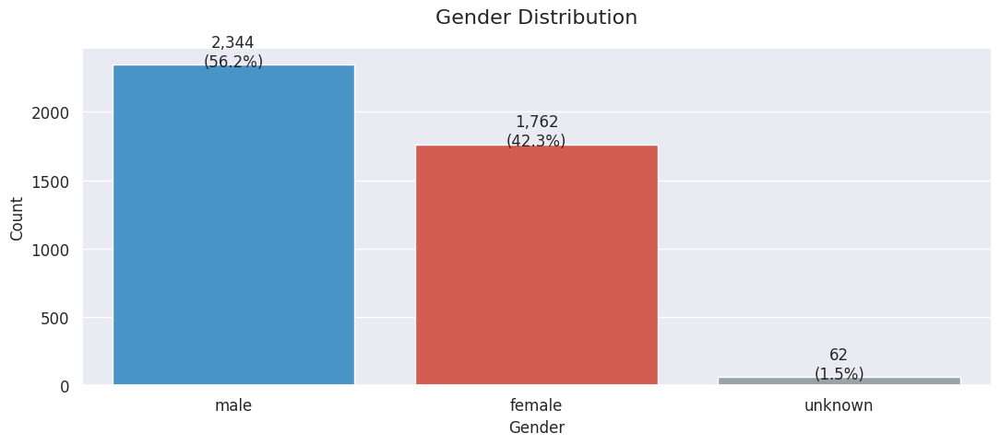

In [69]:
gender_counts = names_df['gender'].value_counts()
gender_percent = names_df['gender'].value_counts(normalize=True) * 100
# Set style
#sns.set_style("whitegrid")
plt.figure(figsize=(11, 5))

palette = {
    'male': '#3498db',   
    'female': '#e74c3c',  
    'unknown': '#95a5a6'  
}

# Plot
ax = sns.barplot(
    x=gender_counts.index,
    y=gender_counts.values,
    palette=[palette[g] for g in gender_counts.index]
)

# Add value labels on top of bars
for p in ax.patches:
    ax.annotate(
        f'{p.get_height():,.0f}\n({gender_percent[p.get_height() == gender_counts].values[0]:.1f}%)',
        (p.get_x() + p.get_width() / 2 , p.get_height()),
        ha='center', va='center',
        xytext=(0, 10),
        textcoords='offset points'
    )

# Customize appearance
plt.title('Gender Distribution', fontsize=16, pad=20)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Remove top and right spines
sns.despine()

# Add some padding
plt.tight_layout()

plt.savefig("website/figures/gender-dist.svg")

# Show plot
plt.show()

---

## 👨‍👩‍👧‍👦 Network 

### Creation of co-mention network

The network we make is something we call co-mention network.

`Node: canonical_name`

`Edge: if two canonical_names share same article_id`

`Edge-weight: Number of distinct articles shared`

**Note:** We only keep edges with weight > 2. e.g., two people can briefly get mentioned in one article. But never mention each other again. This will introduce a lot of noise, since EB-nerd has some article errors that introduces "appetizers" to other article by briefly naming other article titles in the body text (that can include names). Overall, this gave better results. 

In [ ]:
from network_utils import network_summary
from network_utils import create_co_mention_graph

graph = create_co_mention_graph(names_df)

#Run summary statistics of graph
summary, degrees, centrality = network_summary(graph)  

print("NETWORK SUMMARY STATISTICS".center(50))
print(summary.to_string(index=False))
print("\n" + "TOP 5 MOST CONNECTED NODES".center(50) + "\n")
print(degrees.sort_values('Degree', ascending=False).head(5))


            NETWORK SUMMARY STATISTICS            
        Metric    Value
         Nodes 2347.000
         Edges 8606.000
Average Degree    7.334

            TOP 5 MOST CONNECTED NODES            

                    Degree
Dronning Margrethe     117
Joachim                114
Henrik                 100
Frederik                89
Christian               87


Its now possible to visulise the network

In [ ]:
import netwulf as nw


# Create visualization and get styled network data
styled_network, _ = nw.visualize(
    graph,
    port=420,  # Run in headless mode
    plot_in_cell_below= True
)


The plot uses netwulf, and opens in a external window. Under is a picture embedded of it. The size of the nodes varies by the strength. That means the bigger the node, the more co-mentions

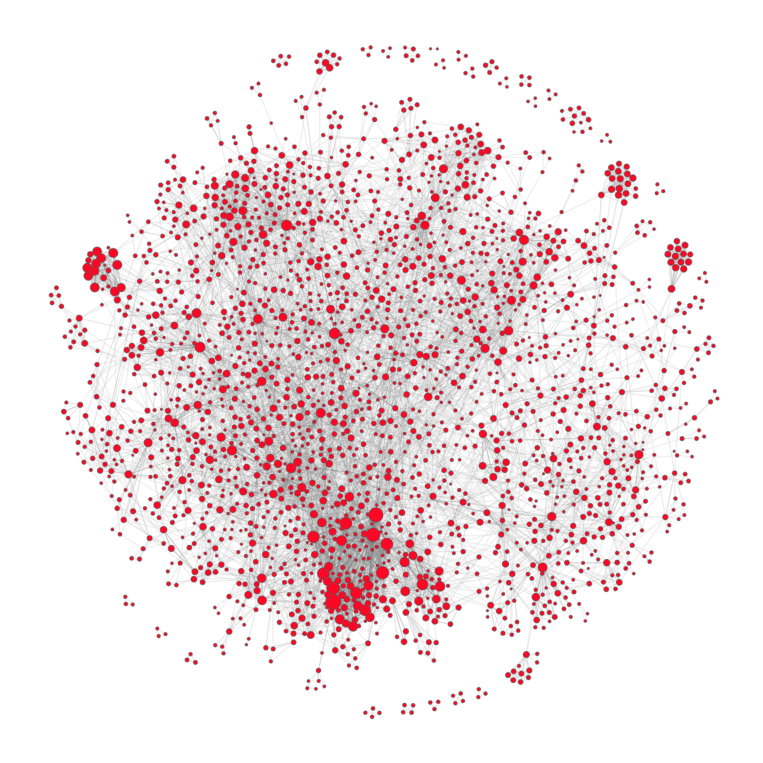

In [35]:

image = mpimg.imread('pictures/graph1.png')

# Set a higher DPI and larger figsize
plt.figure(figsize=(10, 8), dpi=120)  # Increase dpi for finer control

# Display image with manual scaling
plt.imshow(image, extent=[0, 10, 0, 10])  # Stretch to fit (xmin, xmax, ymin, ymax)
plt.axis('off')
plt.show()


### Analysis of co-mention graph

#### Powerlaw and top-hubs: 
First we are interested in checking if our network follows a power-law distribution. We do this by using the libary powerlaw

Alpha (power-law exponent): 3.2587

Log-likelihood ratio (vs exponential): R = 23.0994, p = 0.0013
Power-law is a significantly better fit than exponential.


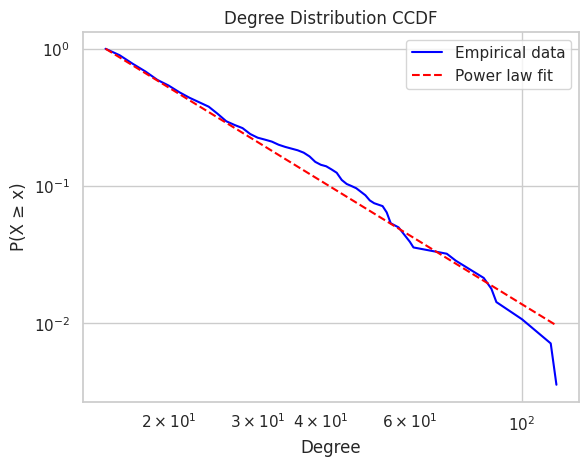

In [36]:


# Step 1: Get degrees 
degrees = [deg for _, deg in graph.degree()]

# Step 2: Fit power-law model
fit = powerlaw.Fit(degrees, verbose=False)

# Step 3: Print alpha (power-law exponent) 
print(f"Alpha (power-law exponent): {fit.power_law.alpha:.4f}")

# Step 4: Compare with other distributions
R, p = fit.distribution_compare('power_law', 'exponential')
print(f"\nLog-likelihood ratio (vs exponential): R = {R:.4f}, p = {p:.4f}")
if R > 0 and p < 0.05:
    print("Power-law is a significantly better fit than exponential.")
else:
    print("Power-law is NOT a significantly better fit than exponential.")


fig = fit.plot_ccdf(color='blue', label='Empirical data')
fit.power_law.plot_ccdf(ax=fig, color='red', linestyle='--', label='Power law fit')
plt.legend()
plt.title("Degree Distribution CCDF")
plt.xlabel("Degree")
plt.ylabel("P(X ≥ x)")
plt.grid(True)
plt.show()


**The richer-gets-richer effect:** 

- In this co-mention network, most persons are only occasionally mentioned alongside others, but a small number (e.g., celebrities) appear in many different articles. These high-degree nodes act as hubs, not necessarily because articles are about them, but because they are repeatedly co-mentioned with a wide range of others articles. Their celebrity status makes them more likely to be mentioned again. 

This means that if our data analysis capture a few of the top celebrities (either though communities or greedily adding to data), much of the media discourse can be analyzed using a few top candidates and their connections since they have lots of media coverage.  



In [37]:
# Top 20 hubs and their gender proportions
top_names = [n for n, _ in sorted(nx.degree_centrality(graph).items(), key=lambda x: -x[1])[:20]]
gender_proportions = names_df[names_df["canonical_name"].isin(top_names)]["gender"].value_counts(normalize=True)
print("Top hub gender proportions:\n", gender_proportions)

# Degree stats by gender for all nodes in graph
node_data = pd.DataFrame({'canonical_name': list(graph.nodes())}).merge(
    names_df[['canonical_name', 'gender']], on='canonical_name')
node_data['degree'] = node_data['canonical_name'].map(dict(graph.degree()))
gender_stats = node_data.groupby('gender')['degree'].agg(['count'])
print("Degree stats by gender:\n", gender_stats)


Top hub gender proportions:
 gender
male      0.55
female    0.45
Name: proportion, dtype: float64
Degree stats by gender:
          count
gender        
female    1018
male      1291
unknown     38


The fact that men and women are almost equally represented among the top hubs means women are clearly part of the conversation, but to really understand how gender plays out in the language, we need to analyse even further. 

**Note** We have filthered out alot of unnecessary nodes, thats why the gender count have fallen. 

#### Random network or tendency?: 
Does our network actually capture a social pattern? To check we must construct a random network from our graph by doing double-edge-swap and compare `degree_assortativity_coefficient`



In [38]:
nx.degree_assortativity_coefficient(graph)

0.08075645653271298

Assortativity measures the similarity of connections in the graph with respect to the node degree. (nx-docs). 

the graph gets positive degree assortativity: high-degree nodes tend to connect (slightly) more with other high-degree nodes. Also supported by the richer gets richer effect shown. (certain celebrities captures the media spotlight)



**Double-edge-swap test**
We then do the double-edge-swap test $10 \times 8591$(edges) a hundred times and compare the swapped network to the social network.

In [39]:
import networkx as nx
import numpy as np
from scipy.stats import norm

r_real = nx.degree_assortativity_coefficient(graph)

# Parameters
n_randomizations = 100
nswap = 10 * graph.number_of_edges()
max_tries = nswap * 100
seed = 4

# Store assortativity va lues from randomized graphs
r_random = []

for i in range(n_randomizations):
    H_copy = graph.copy()
    # Perform edge swaps while preserving degree sequence
    nx.double_edge_swap(H_copy, nswap=nswap, max_tries=max_tries, seed=seed + i)
    r = nx.degree_assortativity_coefficient(H_copy)
    r_random.append(r)

# Compute mean and std of the null distribution
mean_r = np.mean(r_random)
std_r = np.std(r_random)

# Z-score and (two-tailed) p-value
z = (r_real - mean_r) / std_r
p_value = 2 * (1 - norm.cdf(abs(z)))  # Two-tailed test

# Results
print(f"Real assortativity: {r_real:.4f}")
print(f"Random mean: {mean_r:.4f}, std: {std_r:.4f}")

if p_value < 0.05:
    print("Reject H0. Do not reject H1")



Real assortativity: 0.0808
Random mean: -0.0270, std: 0.0080
Reject H0. Do not reject H1


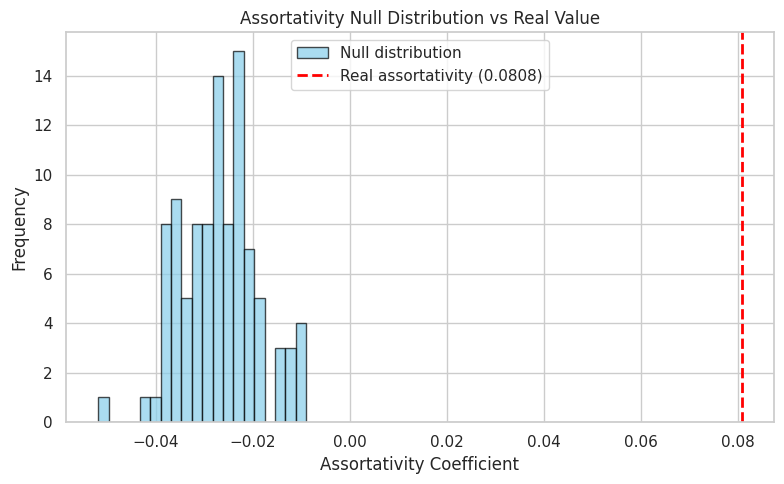

In [40]:
plt.figure(figsize=(8, 5))
plt.hist(r_random, bins=20, alpha=0.7, color='skyblue', edgecolor='black', label='Null distribution')
plt.axvline(r_real, color='red', linestyle='--', linewidth=2, label=f'Real assortativity ({r_real:.4f})')

plt.title('Assortativity Null Distribution vs Real Value')
plt.xlabel('Assortativity Coefficient')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

This indicates that the assortativity coefficient from the randomized networks generated from the real graph stats are indeed far away from the real graph. In other words, the real graph structure wrt. the assortativity coefficient is not randomized and carries a proper non-randomized order.

We can clearly reject the null hypothethis that our social network dosent capture any tendencies, and accept the secondary hypothethis. So we cannot reject that our graph captures a tendency. 

### Community detection 

In order to detect communties, we are interrested in finding the ones that maximizes modelarity. ( higher modularity indicates a more pronounced community structure). 

We are using a louvain_based comunity detection, but we have applied a bunch of adhoc filters as hypterparameters. 

This is how the algorithm works step by step:

1. Run multiple times (R = 50)
    - We shuffle the edges (keep the structure, but not list sequence)
    - Filther out edges with weight > 4 (We are interested in smaller communties, but with weight smaller than 4 we risk getting large non-meaningfull partition)  
    - Do best_partition (tuned using resultion which values bias toward smaller communities)
2. Keep the best_partition that maxemises modularity
3. Post processing 
    - We pick the highest degree celeb in each partition called `seed`, which should be a hub (the community revolves about them)
    - For each node, check that its `internal edge weight / total edge weight ≥ cohesion_ratio`
    - Further filter to keep only nodes with at least 2 neighbors within the filtered community.

This way we make the louvain create communties that went from very large partitions, to medium-small sized. 



In [41]:


top_communities = louvain_based_communities_randomized(
    graph,
    runs=50,
    top_k=10,
    weight_threshold=4,     # moderate filtering
    cohesion_ratio=0.4,     # slightly more permissive
    seed=69,
    res=1.50                 # lower resolution for bigger communities
)

# Display results
for i, comm in enumerate(top_communities, 1):
    members = [(n, graph.degree(n), graph.degree(n, weight='weight')) for n in comm['members']]
    members_sorted = sorted(members, key=lambda x: -x[1])[:5]

    density = comm['internal_edges'] / (comm['size'] * (comm['size'] - 1) / 2 + 1e-9)
    boundary_edges = list(edge_boundary(graph, comm['members']))

    print(f"\nCommunity {i} (Seed: {comm['seed']})")
    print(f"Size: {comm['size']} | Internal Strength: {comm['internal_edges']}")
    print(f"Density: {density:.2f} | Boundary Edges: {len(boundary_edges)}")
    print("Top Members [Name | Degree | Total Co-mentions]:")
    for name, deg, strength in members_sorted:
        print(f"  {name:20} {deg:3} | {strength:5}")


Community 1 (Seed: Joachim)
Size: 104 | Internal Strength: 6801
Density: 1.27 | Boundary Edges: 530
Top Members [Name | Degree | Total Co-mentions]:
  Dronning Margrethe   117 |  1310
  Joachim              114 |  1641
  Henrik               100 |  1128
  Frederik              89 |   741
  Christian             87 |   683

Community 2 (Seed: Harry)
Size: 41 | Internal Strength: 1595
Density: 1.95 | Boundary Edges: 182
Top Members [Name | Degree | Total Co-mentions]:
  Harry                 47 |   538
  Dronning Elizabeth    42 |   370
  William               42 |   349
  Philip                37 |   200
  Kong Charles          34 |   297

Community 3 (Seed: Geggo)
Size: 24 | Internal Strength: 676
Density: 2.45 | Boundary Edges: 113
Top Members [Name | Degree | Total Co-mentions]:
  Geggo                 38 |   335
  Linse Kessler         34 |   232
  Stephanie             32 |   219
  Mikkel Kessler        22 |   127
  Mikkel                21 |   108

Community 4 (Seed: Silas Holst)

We have added 3 measures to the communties:

 1. Density: (Actual connections) / (Possible connections)

 2. Internal Strength: Total weight of all connections between members within the community

 3. Boundary Edges: Connections to outside partition


**Community 1: Danish Royal Family**

- Highest internal strength (6801) and have a density of (1.25) which indicates alot of external connections. (The royal family is a huge network)

Reflects extensive Danish media coverage of royal affairs

**Community 2: British Royal Family**

**Community 3: "Familien fra Bryggen"**

- Highest density (2.24). Its a closed network. 

 Popular DR reality show about a Copenhagen family

**Community 4: Vild med dansk / Tv2**

**Community 5: TV-writers**
- Largest community with size 119 (very low density)

**Community 6: Danish song writers**

**Community 7: Danish song writers"** 

**Community 8: Danish models / celebrities**

**Community 9: SOME influencers**

**Community 10: Public Figures**
 - Not possible to entirely identify due to missing last names.  


its possible to plot the graph but with colored partitions

In [42]:
import matplotlib.colors as mcolors
import numpy as np
import netwulf as nw
# Generate distinct colors
def get_distinct_colors(n):
    """Generate n visually distinct colors"""
    cmap = plt.cm.get_cmap('tab20', n)
    return [mcolors.to_hex(cmap(i)) for i in range(n)]

# Prepare colors
community_colors = get_distinct_colors(len(top_communities))
default_color = [0.3, 0.3, 0.3, 0.6]  # Normalized gray

# Assign colors and find biggest node in each community
node_info = {}
community_representatives = {}

for i, comm in enumerate(top_communities):
    # Get color in normalized RGBA
    rgb = mcolors.hex2color(community_colors[i])
    rgba = list(rgb) + [1.0]  # [r, g, b, a] in range [0,1]
    
    # Find node with highest weighted degree in this community
    members_with_degree = [(n, graph.degree(n, weight='weight')) for n in comm['members']]
    biggest_node = max(members_with_degree, key=lambda x: x[1])[0]
    community_representatives[i] = biggest_node
    
    for node in comm['members']:
        node_info[node] = {
            'color': rgba,
            'community': i + 1,
            'is_representative': (node == biggest_node)
        }

# Handle unassigned nodes
for node in graph.nodes():
    if node not in node_info:
        node_info[node] = {
            'color': default_color,
            'community': 0,
            'is_representative': False
        }

# Create visual attributes
node_colors = [node_info[n]['color'] for n in graph.nodes()]
node_sizes = [np.log(graph.degree(n, weight='weight')+1)*5 for n in graph.nodes()]

# Layout
pos = nx.spring_layout(graph, weight='weight', k=0.2, iterations=200)

# Prepare the network for visualization
H_visual = nx.Graph(graph)

# Add node attributes
for i, node in enumerate(H_visual.nodes()):
    hex_color = mcolors.to_hex(node_info[node]['color'])
    H_visual.nodes[node].update({
        'x': pos[node][0],
        'y': pos[node][1],
        'size': node_sizes[i],
        'color': hex_color,
        'community': node_info[node]['community'],
        'is_representative': node_info[node]['is_representative']
    })

    # Special styling for representative nodes
    if node_info[node]['is_representative']:
        H_visual.nodes[node].update({
            'label': node,
            'label_color': [255, 255, 255, 1],  # White text
            'label_stroke_color': [0, 0, 0, 1],   # Black outline
            'label_size': 16,
            'size': node_sizes[i] * 1.2  # Slightly bigger
        })

# Edge styling
for u, v in H_visual.edges():
    weight = graph[u][v]['weight']
    H_visual.edges[u,v]['width'] = np.log(weight+1)
    H_visual.edges[u,v]['color'] = [100, 100, 100, 0.2]


# Visualize
network, config = nw.visualize(H_visual, port = 422)


/tmp/ipykernel_8356/2454207281.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', n)


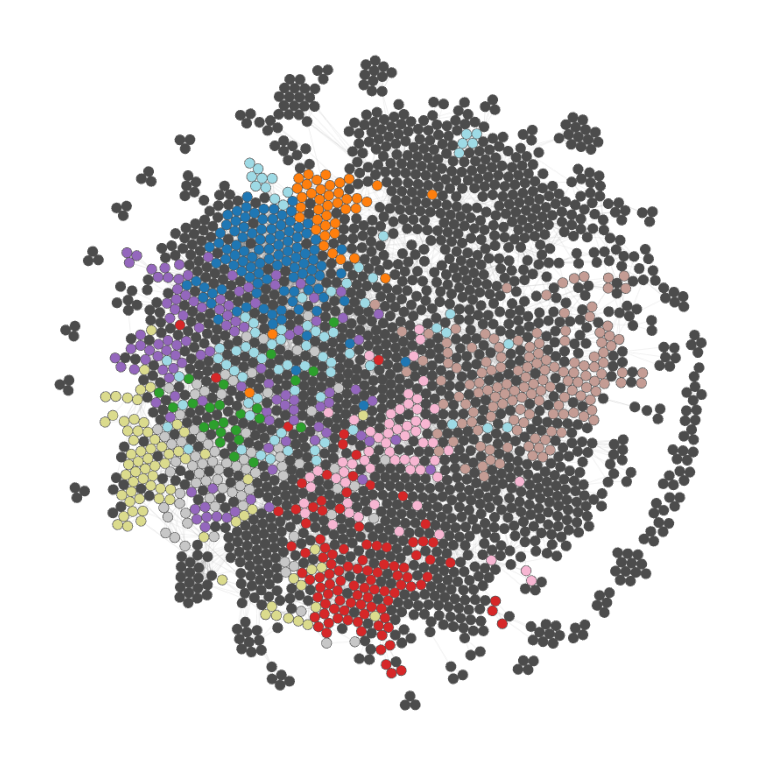

In [43]:
image = mpimg.imread('pictures/graph2.png')

# Set a higher DPI and larger figsize
plt.figure(figsize=(10, 8), dpi=120)  # Increase dpi for finer control

# Display image with manual scaling
plt.imshow(image, extent=[0, 10, 0, 10])  # Stretch to fit (xmin, xmax, ymin, ymax)
plt.axis('off')
plt.show()

It's very easy to see that our partition algorithm have found some communities. 

Then we save the found communties in a dataframe. 

In [44]:
# Collect community info into a list of dicts
community_data = []
for i, comm in enumerate(top_communities, 1):
    members = [(n, graph.degree(n), graph.degree(n, weight='weight')) for n in comm['members']]
    members_sorted = sorted(members, key=lambda x: -x[1])[:5]

    density = comm['internal_edges'] / (comm['size'] * (comm['size'] - 1) / 2 + 1e-9)
    boundary_edges = list(edge_boundary(graph, comm['members']))

    top_members = [name for name, _, _ in members_sorted]

    community_data.append({
        "community_id": i,
        "seed": comm['seed'],
        "size": comm['size'],
        "internal_edges": comm['internal_edges'],
        "density": density,
        "boundary_edges": len(boundary_edges),
        "top_members": top_members,
        "all_members": list(comm['members']),
    })

# Create DataFrame
communities_df = pd.DataFrame(community_data)

communities_df.to_parquet("dataset/top_communities.parquet")

# Display or save
communities_df



,community_id,seed,size,internal_edges,density,boundary_edges,top_members,all_members
0,1,Joachim,104,6801,1.269791,530,"[Dronning Margrethe, Joachim, Henrik, Frederik...","[Nikolai, Frederik, Amber Petty, Jørgen Og, Er..."
1,2,Harry,41,1595,1.945122,182,"[Harry, Dronning Elizabeth, William, Philip, K...","[Asbjørn Nielsen, Piers Morgan, Dronning Eliza..."
2,3,Geggo,24,676,2.449275,113,"[Geggo, Linse Kessler, Stephanie, Mikkel Kessl...","[Didde, Cengiz Salvarli, Lulu, Linse Kessler, ..."
3,4,Silas Holst,104,2185,0.407954,337,"[Silas Holst, Mascha Vang, Christiane Schaumbu...","[Branco, Lise Rønne, Jenna Bagge, Nicolaj Kope..."
4,5,Nikolaj Lie Kaas,119,2187,0.311494,379,"[Nikolaj Lie Kaas, Trine Dyrholm, Mads Mikkels...","[Jussi Adler Olsen, Anders W. Berthelsen, Mikk..."
5,6,Christopher,95,1730,0.387458,317,"[Christopher, Medina, Alexander, Christian Kjæ...","[Walid Bechara, Frederik Bagger, Tessa Franck,..."
6,7,Thomas Helmig,12,217,3.287879,17,"[Thomas Helmig, Renée Toft Simonsen, Hugo Helm...","[Søs Fenger, Renée Toft Simonsen, Hugo Helmig,..."
7,8,Oliver Bjerrehuus,81,1207,0.372531,280,"[Oliver Bjerrehuus, Henrik Qvortrup, Amalie, N...","[Oliver Bjerrehuus, Michael Schøt, Michael Bun..."
8,9,Fie Laursen,73,1046,0.398021,143,"[Fie Laursen, Teitur Skoubo, Lenny Pihl, Anne ...","[Faustix, Mio, Viggo, Ralf Christensen, Lai Yd..."
9,10,Martin,70,831,0.344099,310,"[Kasper, Caroline, Emma, Trine, Anna]","[Rosa, Preben Kristensen, Rasmus, Christian De..."


We can also calculate the overall modularity for each community and how much they contribute to the overall moduluarity of the graph

In [45]:
def calculate_modularity(G, communities):
    """Calculate modularity for each community and total"""
    total_weight = G.size(weight='weight')
    Q_total = 0
    

    for comm in communities:
        members = comm['members']
        # Internal edge weight
        l_c = comm['internal_edges']
        # Total degree of community members
        d_c = sum(G.degree(n, weight='weight') for n in members)
        
        # Community's modularity contribution
        Q_comm = (l_c/total_weight) - (d_c/(2*total_weight))**2
        comm['modularity'] = Q_comm
        Q_total += Q_comm
        
    return Q_total

# Add to your analysis
total_modularity = calculate_modularity(graph, top_communities)

print(f"\nTotal Network Modularity: {total_modularity:.3f}")
for i, comm in enumerate(top_communities, 1):
    print(f"Community {i} Modularity: {comm['modularity']:.3f}")
    


Total Network Modularity: 0.350
Community 1 Modularity: 0.117
Community 2 Modularity: 0.032
Community 3 Modularity: 0.014
Community 4 Modularity: 0.043
Community 5 Modularity: 0.043
Community 6 Modularity: 0.034
Community 7 Modularity: 0.005
Community 8 Modularity: 0.024
Community 9 Modularity: 0.022
Community 10 Modularity: 0.017


Reading of the total network modularity, our graph has a non-random clustering, but communities aren’t perfectly isolated from the rest. This can also be seen on the community "boundary_edges" where we see it has alot of spillover to other communities. (or just be observed on the picture)

---

## 🔎 Language Analysis (Using NLP and TF-IDF)

Now we are interested in doing a language analysis of the articles and communities. To achieve this, we will use both the NLP results we have gathered earlier, and techniques such as TF and TF-IDF.

**Term Frequency (TF)**
Measures how frequently a term appears in a document relative to its length.  
**Formula**:  
$$ \text{TF}(t,d) = \frac{\text{Number of times term } t \text{ appears in document } d}{\text{Total number of terms in document } d} $$  

Example: In a 1000-word article where "kongehus" appears 15 times:  
`TF("kongehus", article) = 15/1000 = 0.015`

**Term Frequency-Inverse Document Frequency (TF-IDF)**
Measures how important a term is to a document in a collection, balancing:
- Frequency in document (TF)
- Rarity across corpus (IDF)

**Formulas**:  
$$ \text{TF-IDF}(t,d,D) = \text{TF}(t,d) \times \text{IDF}(t,D) $$  
$$ \text{IDF}(t,D) = \log\left(\frac{\text{Total number of documents } |D|}{\text{Number of documents containing term } t}\right) $$  

Example: If "kongehus" appears in 50 of 10,000 documents:  
`IDF("kongehus") = log(10000/50) ≈ 5.30`  
`TF-IDF = 0.015 * 5.30 ≈ 0.0795`

**Unique TF**
Is just taking the largest TF weighted words, and making sure its unique to the words in the community (i.e finding unique frequently used words for men and women)

 Application to Community Analysis
We will use these metrics to:  
________ 
- **TF-IDF** Terms that best describe the gender in the community
- **TF** Terms that are frequently used to describe the gender in the community
- **TF-Unique** Terms that are uniquely used to describe the gender in the community

### Community Analysis

#### Gendered wording analysis using TF-IDF 


We will use a wordcloud to construct an easy overview of the TF-IDF and TF. We will also take the top N = 15 unique TF weighted words for each community. We will also make sure to seppereate the words for each gender in each community. 

The algorithm words the following way:
- First it cleans the text and removes simmilar words using sequence mathcer with threshold at 0.80. 
- Then for each community, get all the person_descriptions from members of the community
- Per community
    - Sepperate by men/female
    - Perform TF-IDF of terms from each sepperation. (return top 15)
    - Perform unique TF (returns words appearing in only one of the sepperations)
- Plot the words found in a sepperated wordcloud.

Row one is community 1.
Row two is community 2. and so on...

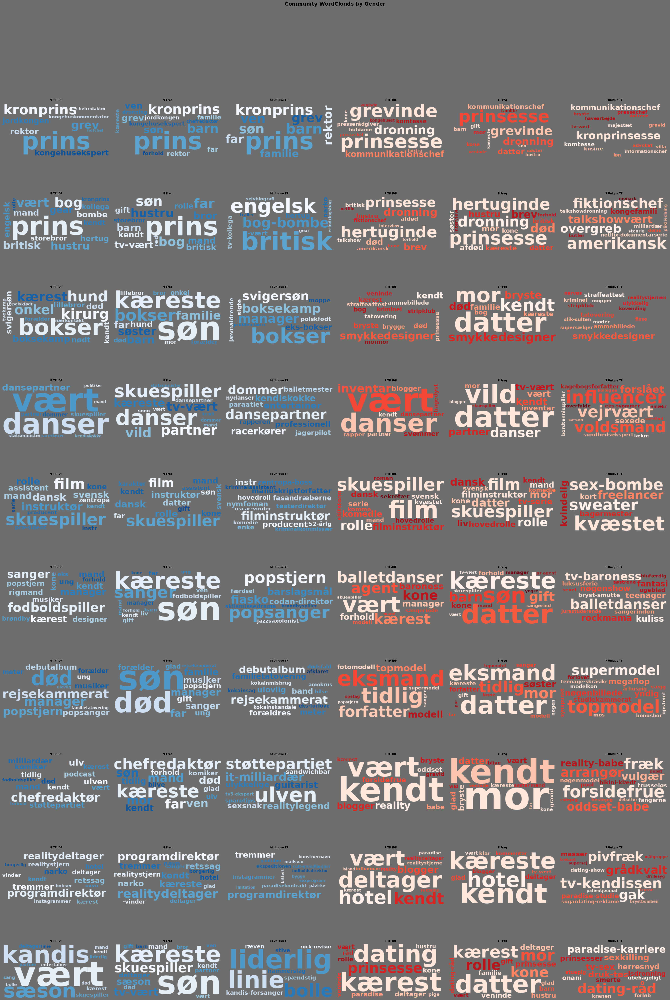

In [46]:
BOLD_FONT_PATH = "/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf"
if not os.path.exists(BOLD_FONT_PATH):
    BOLD_FONT_PATH = None

BACKGROUND_COLOR = '#6e6e6e'


def preprocess_text(text):
    """Clean and normalize Danish/English text."""
    if pd.isna(text):
        return ""
    text = re.sub(r'[^\wæøåÆØÅ-]', ' ', str(text).lower())
    return ' '.join([word for word in text.split() if len(word) > 2 and not word.isdigit()])

def filter_similar_words(word_dict, threshold=0.80):
    """Filter out similar words using fuzzy matching."""
    filtered, seen = {}, set()
    for word in sorted(word_dict, key=word_dict.get, reverse=True):
        if any(SequenceMatcher(None, word, s).ratio() >= threshold for s in seen):
            continue
        seen.add(word)
        filtered[word] = word_dict[word]
    return filtered


def get_community_documents(communities, names_df):
    """Extract and clean all member descriptions per community."""
    docs = defaultdict(str)
    for comm_id, comm in enumerate(communities):
        for member in comm['members']:
            try:
                match = names_df[names_df['canonical_name'].str.lower().fillna('') == member.lower()]
                if match.empty:
                    continue

                descs = match.iloc[0]['person_descriptions']
                if isinstance(descs, str):
                    try:
                        descs = eval(descs)
                    except:
                        continue

                if isinstance(descs, dict):
                    all_words = []
                    for desc_list in descs.values():
                        if isinstance(desc_list, list):
                            clean = preprocess_text(' '.join(desc_list))
                            if clean:
                                all_words.append(clean)
                    docs[comm_id] += ' ' + ' '.join(all_words)
            except Exception as e:
                print(f"Error processing {member}: {e}")
    return docs


def make_wordcloud(word_dict, color, ax, title):
    ax.set_facecolor(BACKGROUND_COLOR)
    if word_dict:
        wc = WordCloud(
            width=400, height=200, background_color=BACKGROUND_COLOR,
            colormap=color, contour_width=1.5, contour_color='black',
            font_path=BOLD_FONT_PATH, random_state=42, min_font_size=14
        ).generate_from_frequencies(word_dict)
        ax.imshow(wc, interpolation='bilinear')
        ax.set_title(title, fontsize=11, weight='bold', pad=10, color='black')
    else:
        ax.text(0.5, 0.5, "No Data", ha='center', va='center',
                fontsize=10, weight='bold', color='black')
    ax.axis('off')


def analyze_communities(top_communities, names_df):
    community_docs = get_community_documents(top_communities, names_df)
    docs = [community_docs[i] for i in range(len(community_docs)) if community_docs[i]]

    vectorizer = TfidfVectorizer(
        token_pattern=r'\b[^\d\W]{3,}\b', min_df=1, max_df=0.9
    )
    tfidf_matrix = vectorizer.fit_transform(docs)
    terms = vectorizer.get_feature_names_out()
    gender_group_occurrences = defaultdict(set)

    num_communities = len(top_communities)
    fig, axes = plt.subplots(num_communities, 6, figsize=(40, num_communities * 6),
                             facecolor=BACKGROUND_COLOR)
    fig.suptitle("Community WordClouds by Gender", fontsize=22, weight='bold', y=1.02, color='black')

    for row_idx, comm in enumerate(top_communities):
        comm_id = row_idx
        male_words, female_words = [], []

        for member in comm['members']:
            match = names_df[names_df['canonical_name'].str.lower() == member.lower()]
            if match.empty:
                continue
            gender = match.iloc[0].get('gender')
            descs = match.iloc[0].get('person_descriptions')

            if isinstance(descs, str):
                try:
                    descs = eval(descs)
                except:
                    continue

            if isinstance(descs, dict):
                all_text = [preprocess_text(' '.join(desc_list)) 
                            for desc_list in descs.values() if isinstance(desc_list, list)]
                joined = " ".join(filter(None, all_text))
                if gender == "male":
                    male_words.append(joined)
                elif gender == "female":
                    female_words.append(joined)

        for col_offset, group_words, color, prefix in [
            (0, male_words, "Blues", "M"),
            (3, female_words, "Reds", "F")
        ]:
            full_text = " ".join(group_words)
            tokens = full_text.split()
            counter = Counter(tokens)

            gender_key = f"{comm_id}_{prefix}"
            for word in set(tokens):
                gender_group_occurrences[word].add(gender_key)

            # TF-IDF
            try:
                subgroup_vec = vectorizer.transform([" ".join(group_words)])
                tfidf_scores = subgroup_vec.toarray().flatten()
                tfidf_words = {
                    terms[idx]: tfidf_scores[idx]
                    for idx in tfidf_scores.argsort()[::-1]
                    if tfidf_scores[idx] > 0
                }
                tfidf_words = dict(list(filter_similar_words(tfidf_words).items())[:15])
            except:
                tfidf_words = {}

            # Frequency
            freq_words = dict(list(filter_similar_words(counter).items())[:15])

            # Unique word scaling
            unique = {w: counter[w] for w in counter if len(gender_group_occurrences[w]) == 1}
            unique = filter_similar_words(unique)
            values = list(unique.values())
            if values:
                min_f, max_f = min(values), max(values)
                scaled = {
                    w: int(10 + (c - min_f) / (max_f - min_f + 1e-5) * 90)
                    for w, c in unique.items()
                }
                unique_words = dict(sorted(scaled.items(), key=lambda x: x[1], reverse=True)[:15])
            else:
                unique_words = {}

            for j, (word_dict, title) in enumerate([
                (tfidf_words, f"{prefix} TF-IDF"),
                (freq_words, f"{prefix} Freq"),
                (unique_words, f"{prefix} Unique TF")
            ]):
                ax = axes[row_idx, col_offset + j] if num_communities > 1 else axes[col_offset + j]
                make_wordcloud(word_dict, color, ax, title)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig("da-wordcloud.pdf")
    plt.savefig("da-wordcloud.png")
    plt.show()
# Example call — make sure these variables are defined
analyze_communities(top_communities, names_df)



English version using the Google translate module:

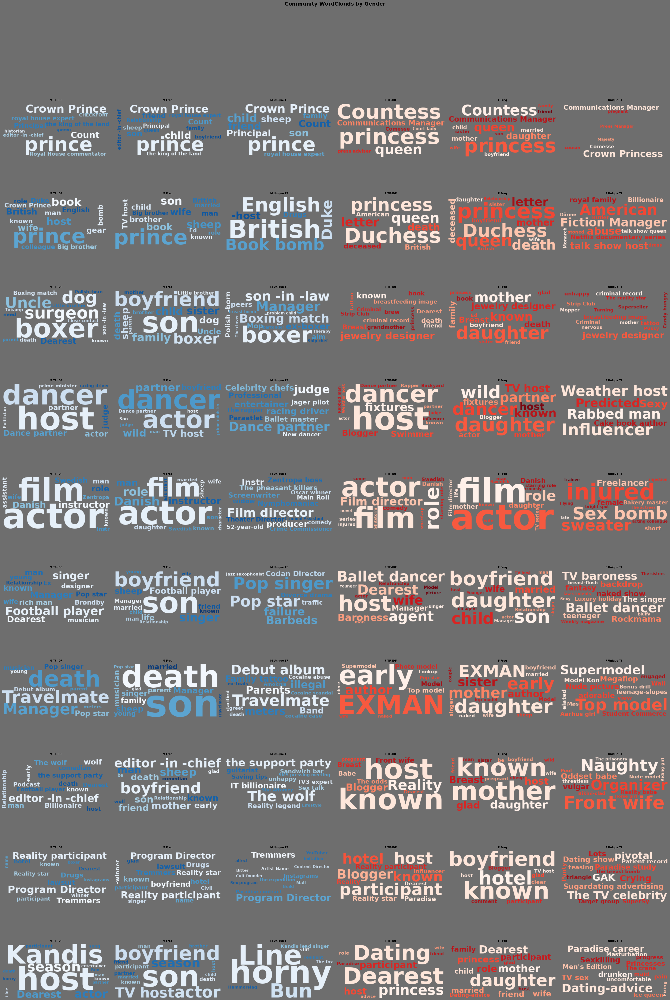

In [47]:

from deep_translator import GoogleTranslator


translation_cache = {}

def translate_words(word_dict, source_lang='da', target_lang='en'):
    translator = GoogleTranslator(source=source_lang, target=target_lang)
    translated = {}
    for word, score in word_dict.items():
        if word in translation_cache:
            translated_word = translation_cache[word]
        else:
            try:
                translated_word = translator.translate(word)
                translation_cache[word] = translated_word
            except:
                translated_word = word  # fallback
                translation_cache[word] = word
        translated[translated_word] = score
    return translated

def preprocess_text(text):
    if pd.isna(text):
        return ""
    text = re.sub(r'[^\wæøåÆØÅ-]', ' ', str(text).lower())
    return ' '.join([word for word in text.split() if len(word) > 2 and not word.isdigit()])

def filter_similar_words(word_dict, threshold=0.80):
    filtered, seen = {}, set()
    for word in sorted(word_dict, key=word_dict.get, reverse=True):
        if any(SequenceMatcher(None, word, s).ratio() >= threshold for s in seen):
            continue
        seen.add(word)
        filtered[word] = word_dict[word]
    return filtered


def get_community_documents(communities, names_df):
    docs = defaultdict(str)
    for comm_id, comm in enumerate(communities):
        for member in comm['members']:
            try:
                match = names_df[names_df['canonical_name'].str.lower().fillna('') == member.lower()]
                if match.empty:
                    continue
                descs = match.iloc[0]['person_descriptions']
                if isinstance(descs, str):
                    try:
                        descs = eval(descs)
                    except:
                        continue
                if isinstance(descs, dict):
                    all_words = []
                    for desc_list in descs.values():
                        if isinstance(desc_list, list):
                            clean = preprocess_text(' '.join(desc_list))
                            if clean:
                                all_words.append(clean)
                    docs[comm_id] += ' ' + ' '.join(all_words)
            except Exception as e:
                print(f"Error processing {member}: {e}")
    return docs


def make_wordcloud(word_dict, color, ax, title):
    ax.set_facecolor(BACKGROUND_COLOR)
    if word_dict:
        wc = WordCloud(
            width=400, height=200, background_color=BACKGROUND_COLOR,
            colormap=color, contour_width=1.5, contour_color='black',
            font_path=BOLD_FONT_PATH, random_state=42, min_font_size=14
        ).generate_from_frequencies(word_dict)
        ax.imshow(wc, interpolation='bilinear')
        ax.set_title(title, fontsize=11, weight='bold', pad=10, color='black')
    else:
        ax.text(0.5, 0.5, "No Data", ha='center', va='center',
                fontsize=10, weight='bold', color='black')
    ax.axis('off')


def analyze_communities(top_communities, names_df):
    community_docs = get_community_documents(top_communities, names_df)
    docs = [community_docs[i] for i in range(len(community_docs)) if community_docs[i]]

    vectorizer = TfidfVectorizer(
        token_pattern=r'\b[^\d\W]{3,}\b', min_df=1, max_df=0.9
    )
    tfidf_matrix = vectorizer.fit_transform(docs)
    terms = vectorizer.get_feature_names_out()
    gender_group_occurrences = defaultdict(set)

    num_communities = len(top_communities)
    fig, axes = plt.subplots(num_communities, 6, figsize=(40, num_communities * 6),
                             facecolor=BACKGROUND_COLOR)
    fig.suptitle("Community WordClouds by Gender", fontsize=22, weight='bold', y=1.02, color='black')

    for row_idx, comm in enumerate(top_communities):
        comm_id = row_idx
        male_words, female_words = [], []

        for member in comm['members']:
            match = names_df[names_df['canonical_name'].str.lower() == member.lower()]
            if match.empty:
                continue
            gender = match.iloc[0].get('gender')
            descs = match.iloc[0].get('person_descriptions')

            if isinstance(descs, str):
                try:
                    descs = eval(descs)
                except:
                    continue

            if isinstance(descs, dict):
                all_text = [preprocess_text(' '.join(desc_list)) 
                            for desc_list in descs.values() if isinstance(desc_list, list)]
                joined = " ".join(filter(None, all_text))
                if gender == "male":
                    male_words.append(joined)
                elif gender == "female":
                    female_words.append(joined)

        for col_offset, group_words, color, prefix in [
            (0, male_words, "Blues", "M"),
            (3, female_words, "Reds", "F")
        ]:
            full_text = " ".join(group_words)
            tokens = full_text.split()
            counter = Counter(tokens)

            gender_key = f"{comm_id}_{prefix}"
            for word in set(tokens):
                gender_group_occurrences[word].add(gender_key)

            # TF-IDF
            try:
                subgroup_vec = vectorizer.transform([" ".join(group_words)])
                tfidf_scores = subgroup_vec.toarray().flatten()
                tfidf_words = {
                    terms[idx]: tfidf_scores[idx]
                    for idx in tfidf_scores.argsort()[::-1]
                    if tfidf_scores[idx] > 0
                }
                tfidf_words = dict(list(filter_similar_words(tfidf_words).items())[:15])
            except:
                tfidf_words = {}

            # Frequency
            freq_words = dict(list(filter_similar_words(counter).items())[:15])

            # Unique word scaling
            unique = {w: counter[w] for w in counter if len(gender_group_occurrences[w]) == 1}
            unique = filter_similar_words(unique)
            values = list(unique.values())
            if values:
                min_f, max_f = min(values), max(values)
                scaled = {
                    w: int(10 + (c - min_f) / (max_f - min_f + 1e-5) * 90)
                    for w, c in unique.items()
                }
                unique_words = dict(sorted(scaled.items(), key=lambda x: x[1], reverse=True)[:15])
            else:
                unique_words = {}

            for j, (word_dict, title) in enumerate([
                (tfidf_words, f"{prefix} TF-IDF"),
                (freq_words, f"{prefix} Freq"),
                (unique_words, f"{prefix} Unique TF")
            ]):
                translated_dict = translate_words(word_dict)  # Efficient translation with cache
                ax = axes[row_idx, col_offset + j] if num_communities > 1 else axes[col_offset + j]
                make_wordcloud(translated_dict, color, ax, title)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig("en-wordcloud.pdf")
    plt.savefig("en-wordcloud.png")
    plt.show()


analyze_communities(top_communities, names_df)


**Plotting of the unique words only**

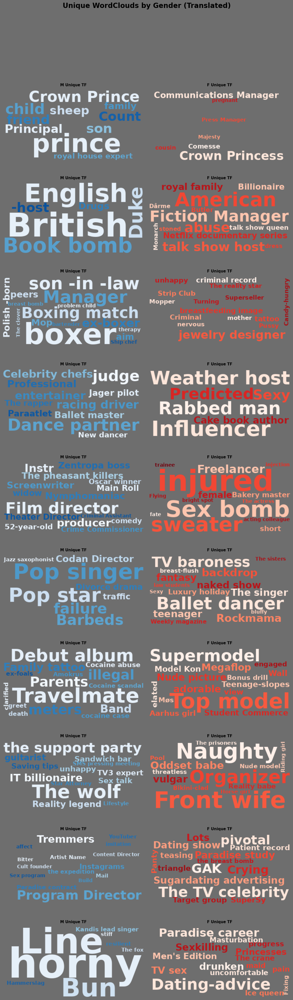

In [50]:
def analyze_communities(top_communities, names_df):
    community_docs = get_community_documents(top_communities, names_df)
    docs = [community_docs[i] for i in range(len(community_docs)) if community_docs[i]]

    vectorizer = TfidfVectorizer(
        token_pattern=r'\b[^\d\W]{3,}\b', min_df=1, max_df=0.9
    )
    tfidf_matrix = vectorizer.fit_transform(docs)
    terms = vectorizer.get_feature_names_out()
    gender_group_occurrences = defaultdict(set)

    num_communities = len(top_communities)
    fig, axes = plt.subplots(num_communities, 2, figsize=(12, num_communities * 4),
                             facecolor=BACKGROUND_COLOR)
    fig.suptitle("Unique WordClouds by Gender (Translated)", fontsize=20, weight='bold', y=1.02, color='black')

    for row_idx, comm in enumerate(top_communities):
        comm_id = row_idx
        male_words, female_words = [], []

        for member in comm['members']:
            match = names_df[names_df['canonical_name'].str.lower() == member.lower()]
            if match.empty:
                continue
            gender = match.iloc[0].get('gender')
            descs = match.iloc[0].get('person_descriptions')

            if isinstance(descs, str):
                try:
                    descs = eval(descs)
                except:
                    continue

            if isinstance(descs, dict):
                all_text = [preprocess_text(' '.join(desc_list)) 
                            for desc_list in descs.values() if isinstance(desc_list, list)]
                joined = " ".join(filter(None, all_text))
                if gender == "male":
                    male_words.append(joined)
                elif gender == "female":
                    female_words.append(joined)

        for col_offset, group_words, color, prefix in [
            (0, male_words, "Blues", "M"),
            (1, female_words, "Reds", "F")
        ]:
            full_text = " ".join(group_words)
            tokens = full_text.split()
            counter = Counter(tokens)

            gender_key = f"{comm_id}_{prefix}"
            for word in set(tokens):
                gender_group_occurrences[word].add(gender_key)

            # Unique word scaling
            unique = {w: counter[w] for w in counter if len(gender_group_occurrences[w]) == 1}
            unique = filter_similar_words(unique)
            values = list(unique.values())
            if values:
                min_f, max_f = min(values), max(values)
                scaled = {
                    w: int(10 + (c - min_f) / (max_f - min_f + 1e-5) * 90)
                    for w, c in unique.items()
                }
                unique_words = dict(sorted(scaled.items(), key=lambda x: x[1], reverse=True)[:15])
            else:
                unique_words = {}

            translated_dict = translate_words(unique_words)
            ax = axes[row_idx, col_offset] if num_communities > 1 else axes[col_offset]
            make_wordcloud(translated_dict, color, ax, f"{prefix} Unique TF")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig("en-wordcloud-unique.pdf")
    plt.savefig("en-wordcloud-unique.png")
    plt.show()

analyze_communities(top_communities, names_df)


 Here its possible to see a clear gender-specific langauge tendency. 

#### Sentiment analysis of communtiies


We are interested in creating a sentiment avg of each community. Both overall and gendered. 

It works by doing the following:

- For each all_members go to names_df and use their canonical_name to search for article_ids
- For each article id in each member.. Check for each article if the article is about them only, by looking at names_df['aliaes] in ner_clusters, if the members aliases dominantes the ner_cluster, the article is about them. Use the article:
- Use the sentiment_label "negative = 0" "positive = 1" and find average sentiment_label of the community. Also make a gendered avg where sentiment for gender = female, and gender = male. 


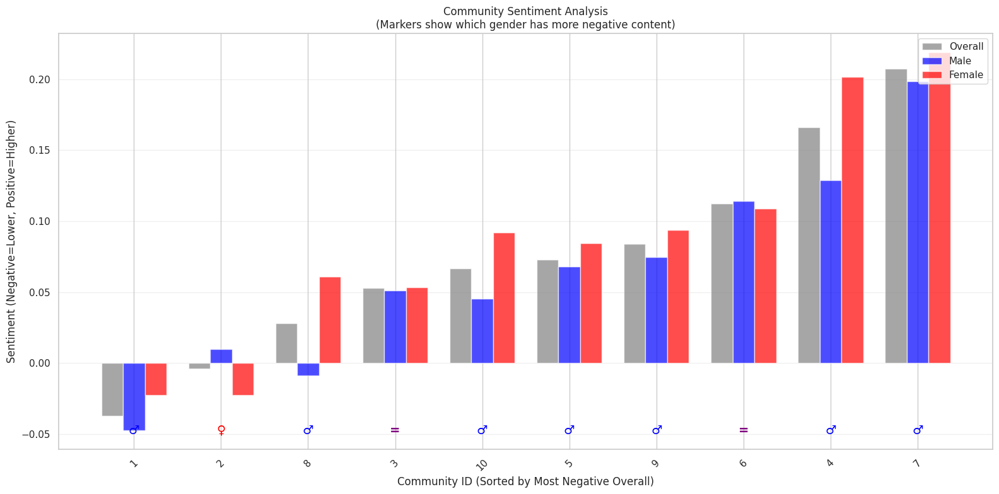

In [51]:
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt

def article_about_member(article_row, aliases):
    clusters = article_row.get('ner_clusters', [])
    if isinstance(clusters, str):
        try:
            clusters = eval(clusters)
        except:
            clusters = []
    
    if not isinstance(clusters, (list, tuple, np.ndarray)):
        return False
    
    # Count how many times each alias appears in the article
    alias_count = Counter([token for token in clusters if token in aliases])
    
    if not alias_count:
        return False
    
    # Find the alias with the highest frequency
    max_count = max(alias_count.values())
    # Get all aliases that have the max count (for ties)
    most_frequent_aliases = [alias for alias, count in alias_count.items() if count == max_count]
    
    # Return the most frequent aliases in the article
    return most_frequent_aliases

# Prepare data storage with community info
results = []

for _, comm in communities_df.iterrows():
    members = comm['all_members']
    all_scores = []
    male_scores = []
    female_scores = []
    comm_id = comm['community_id']

    for member in members:
        person = names_df[names_df['canonical_name'].str.lower() == member.lower()]
        if person.empty:
            continue

        gender = person.iloc[0]['gender']
        aliases = person.iloc[0]['aliases']
        art_ids = person.iloc[0]['article_ids']

        if isinstance(art_ids, str):
            try:
                art_ids = eval(art_ids)
            except:
                continue

        subset = df[df['article_id'].isin(art_ids)].copy()
        
        # Update article filtering logic to handle multiple people if there's a tie
        valid_articles = []
        for idx, row in subset.iterrows():
            involved_people = article_about_member(row, aliases)
            if involved_people:  # If the result is not False
                # Get sentiment score from sentiment_label and sentiment_score
                sentiment_score = row['sentiment_score']  # Assuming this is a float between 0 and 1
                if row['sentiment_label'] == 'negative':
                    weighted_sentiment = -1 * sentiment_score  # Negative sentiment should be negative
                elif row["sentiment_label"] == "neutral":
                    weighted_sentiment = 0
                else:
                    weighted_sentiment = sentiment_score  # Positive sentiment is positive
                
                # Add the weighted sentiment to the lists of scores
                all_scores.append(weighted_sentiment)
                
                if gender == 'male':
                    male_scores.append(weighted_sentiment)
                elif gender == 'female':
                    female_scores.append(weighted_sentiment)
                
                valid_articles.append(row)

        subset = pd.DataFrame(valid_articles)  # Create a new DataFrame with only valid articles

    # Calculate weighted averages and dominance
    avg_overall = np.mean(all_scores) if all_scores else np.nan
    avg_male = np.mean(male_scores) if male_scores else np.nan
    avg_female = np.mean(female_scores) if female_scores else np.nan

    # Determine which gender is more negative (has lower score)
    if np.isnan(avg_male) or np.isnan(avg_female):
        dominance = 'none'
    elif abs(avg_male - avg_female) < 0.01:  # 5% threshold for tie
        dominance = 'tie'
    elif avg_male < avg_female:  # Male is more negative
        dominance = 'male'
    else:  # Female is more negative
        dominance = 'female'
    
    results.append({
        'comm_id': comm_id,
        'overall': avg_overall,
        'male': avg_male,
        'female': avg_female,
        'dominance': dominance
    })

# Sort by most negative overall first
results.sort(key=lambda x: x['overall'] if not np.isnan(x['overall']) else 1)

# Create single plot
plt.figure(figsize=(16, 8))
x = np.arange(len(results))
width = 0.25

# Plot bars
overall_bars = plt.bar(x - width, [r['overall'] for r in results], width, 
                      color='gray', label='Overall', alpha=0.7)
male_bars = plt.bar(x, [r['male'] for r in results], width, 
                   color='blue', label='Male', alpha=0.7)
female_bars = plt.bar(x + width, [r['female'] for r in results], width, 
                     color='red', label='Female', alpha=0.7)

# Add dominance markers at the bottom of each group
for i, r in enumerate(results):
    y_pos = -0.05  # Position below the bars
    if r['dominance'] == 'male':
        plt.text(x[i], y_pos, '♂', ha='center', color='blue', 
                fontsize=14, fontweight='bold')
    elif r['dominance'] == 'female':
        plt.text(x[i], y_pos, '♀', ha='center', color='red', 
                fontsize=14, fontweight='bold')
    elif r['dominance'] == 'tie':
        plt.text(x[i], y_pos, '=', ha='center', color='purple', 
                fontsize=14, fontweight='bold')

plt.xticks(x, [r['comm_id'] for r in results], rotation=45)
plt.xlabel('Community ID (Sorted by Most Negative Overall)')
plt.ylabel('Sentiment (Negative=Lower, Positive=Higher)')
plt.title('Community Sentiment Analysis\n(Markers show which gender has more negative content)')
plt.legend(loc='upper right')
#plt.ylim(-0.1, 0.5)  # Extra space for dominance markers
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig("community-sentiment-analysis.pdf")
plt.show()

#### Hatespeech analysis of communtiies

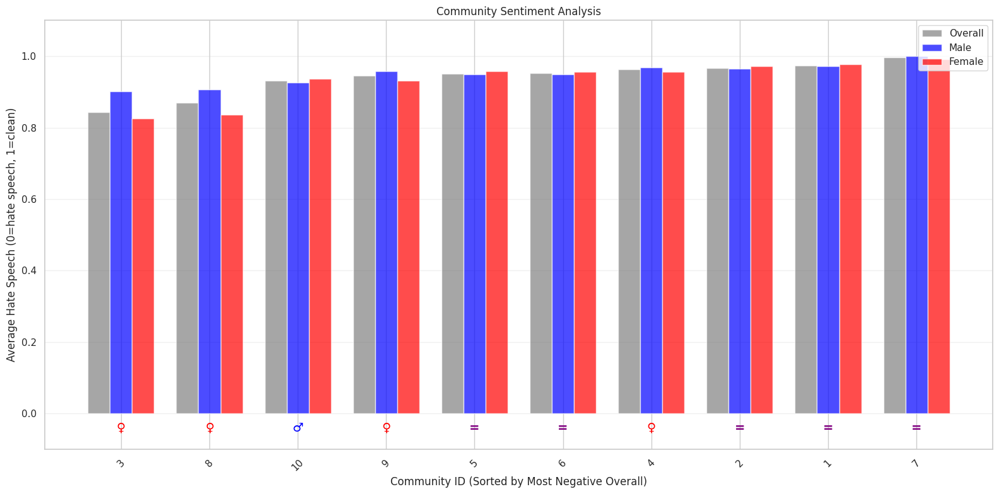

In [55]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict, Counter


def article_about_memberNew(article_row, aliases):
    """Improved article filtering using frequency analysis of NER clusters"""
    clusters = article_row.get('ner_clusters', [])
    
    # Handle string-encoded clusters
    if isinstance(clusters, str):
        try:
            clusters = eval(clusters)
        except:
            clusters = []
    
    if not isinstance(clusters, (list, tuple, np.ndarray)):
        return False
    
    # Count alias occurrences
    alias_counter = Counter(token for token in clusters if token in aliases)
    
    if not alias_counter:
        return False
    
    # Find maximum frequency and return most frequent aliases
    max_freq = max(alias_counter.values())
    return [alias for alias, count in alias_counter.items() if count == max_freq]


def analyze_community_sentiment(communities_df, names_df, article_df):
    """Main analysis function with integrated NER filtering"""
    results = []

    # Process each community
    for _, comm_row in communities_df.iterrows():
        members = comm_row['all_members']
        all_sents = []
        male_sents = []
        female_sents = []
        comm_id = comm_row['community_id']

        for member in members:
            # Member matching
            match = names_df[names_df['canonical_name'].str.lower() == member.lower()]
            if match.empty:
                continue

            # Extract member data
            gender = match.iloc[0]['gender']
            article_ids = match.iloc[0]['article_ids']
            aliases = match.iloc[0]['aliases']

            # Convert string-encoded lists
            for field in [article_ids, aliases]:
                if isinstance(field, str):
                    try:
                        field = eval(field)
                    except:
                        field = []

            # Filter relevant articles
            df_se = article_df[article_df['article_id'].isin(article_ids)].copy()
            df_se = df_se[df_se.apply(lambda row: bool(article_about_memberNew(row, aliases)), axis=1)]

            # Map hate speech labels
            df_se['hate_speech'] = df_se['hate_speech'].map({
                'not offensive': 1, 
                'spam & indhold': 0,
                'personangreb': 0,
                'sprogbrug': 0
            })

            # Collect sentences
            s = df_se['hate_speech'].dropna().tolist()
            all_sents.extend(s)
            if gender == 'male':
                male_sents.extend(s)
            elif gender == 'female':
                female_sents.extend(s)

        # Calculate averages
        avg_overall = np.mean(all_sents) if all_sents else np.nan
        avg_male = np.mean(male_sents) if male_sents else np.nan
        avg_female = np.mean(female_sents) if female_sents else np.nan

        # Determine dominance
        dominance = 'none'
        if not (np.isnan(avg_male) or np.isnan(avg_female)):
            if abs(avg_male - avg_female) < 0.01:
                dominance = 'tie'
            elif avg_male < avg_female:
                dominance = 'male'
            else:
                dominance = 'female'
        
        results.append({
            'comm_id': comm_id,
            'overall': avg_overall,
            'male': avg_male,
            'female': avg_female,
            'dominance': dominance
        })

    # Sort results by negativity
    results.sort(key=lambda x: x['overall'] if not np.isnan(x['overall']) else 1)

    plt.figure(figsize=(16, 8))
    x = np.arange(len(results))
    width = 0.25

    # Create bars
    overall_bars = plt.bar(x - width, [r['overall'] for r in results], width, 
                          color='gray', label='Overall', alpha=0.7)
    male_bars = plt.bar(x, [r['male'] for r in results], width, 
                       color='blue', label='Male', alpha=0.7)
    female_bars = plt.bar(x + width, [r['female'] for r in results], width, 
                         color='red', label='Female', alpha=0.7)

    # Add dominance markers
    for i, r in enumerate(results):
        y_pos = -0.05
        if r['dominance'] == 'male':
            plt.text(x[i], y_pos, '♂', ha='center', color='blue', 
                    fontsize=14, fontweight='bold')
        elif r['dominance'] == 'female':
            plt.text(x[i], y_pos, '♀', ha='center', color='red', 
                    fontsize=14, fontweight='bold')
        elif r['dominance'] == 'tie':
            plt.text(x[i], y_pos, '=', ha='center', color='purple', 
                    fontsize=14, fontweight='bold')

    # Finalize plot
    plt.xticks(x, [r['comm_id'] for r in results], rotation=45)
    plt.xlabel('Community ID (Sorted by Most Negative Overall)')
    plt.ylabel('Average Hate Speech (0=hate speech, 1=clean)')
    plt.title('Community Sentiment Analysis')
    plt.legend(loc='upper right')
    plt.ylim(-0.1, 1.1)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.savefig("hate-speech-gender.pdf")
    plt.show()

analyze_community_sentiment(
    communities_df=communities_df,
    names_df=names_df,
    article_df=df
)

Genereally we see that women are more prone to hate-speech than men in theese communties

#### Emotion distribution of communtiies

We have the following emotions, so by plotting each community over theese its possible to see if a gender dominates one of the categories.

In [56]:
df[df['emotion'] != "not offensive"]['emotion'].unique()

array(['foragt/modvilje', 'forventning/interrese', 'frygt/bekymret',
       'glæde/sindsro', 'no emotion', 'sorg/trist', 'tillid/accept',
       'overasket/målløs', 'vrede/irritation'], dtype=object)

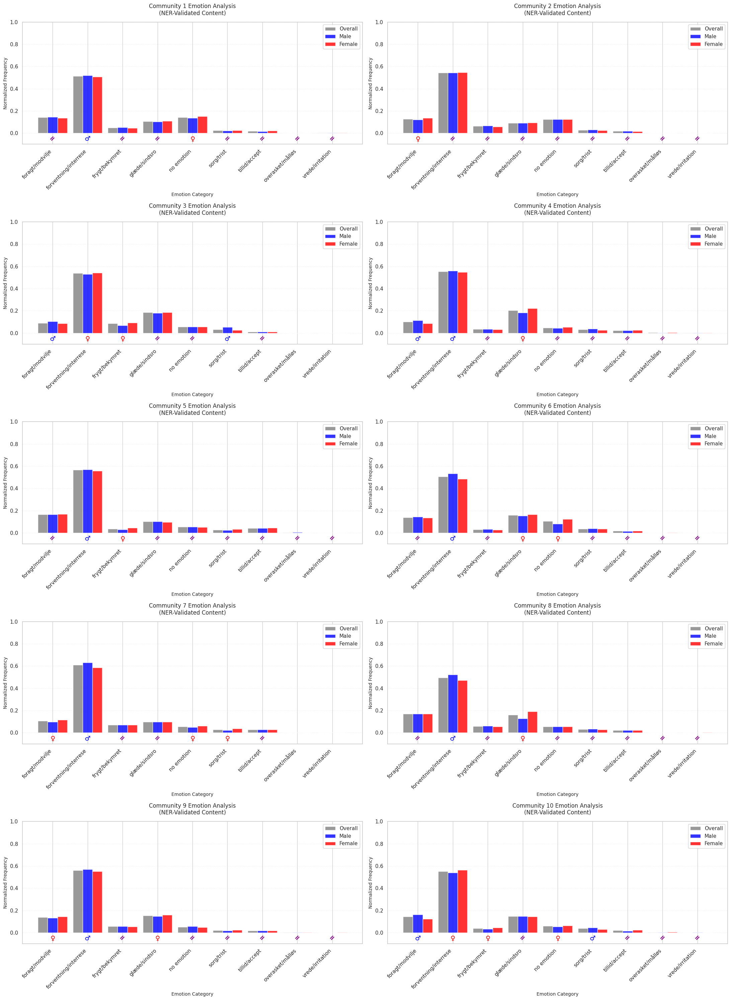

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict, Counter  # Added Counter

def article_about_member(article_row, aliases):
    """Return most frequent aliases appearing in NER clusters"""
    clusters = article_row.get('ner_clusters', [])
    if isinstance(clusters, str):
        try:
            clusters = eval(clusters)
        except:
            clusters = []
    
    if not isinstance(clusters, (list, tuple, np.ndarray)):
        return False
    
    # Count alias frequencies
    alias_counter = Counter(token for token in clusters if token in aliases)
    
    if not alias_counter:
        return False
    
    # Find maximum frequency
    max_count = max(alias_counter.values())
    
    # Get all aliases with max frequency
    most_frequent = [alias for alias, count in alias_counter.items() 
                    if count == max_count]
    
    return most_frequent

# Get unique emotions (excluding "not offensive")
emotions = df[df['emotion'] != "not offensive"]['emotion'].unique()

# Create figure with 5x2 subplots
fig, axes = plt.subplots(5, 2, figsize=(22, 30))
fig.subplots_adjust(hspace=0.5, wspace=0.3)

# Store dominance results
dominance_results = {}

for idx, (comm_id, comm_row) in enumerate(communities_df.iterrows()):
    ax = axes[idx//2, idx%2]
    members = comm_row['all_members']
    emotion_counts = {'overall': defaultdict(int), 
                     'male': defaultdict(int), 
                     'female': defaultdict(int)}
    total = {'overall': 0, 'male': 0, 'female': 0}

    for member in members:
        match = names_df[names_df['canonical_name'].str.lower() == member.lower()]
        if match.empty:
            continue

        gender = match.iloc[0]['gender']
        article_ids = match.iloc[0]['article_ids']
        aliases = match.iloc[0]['aliases']
        
        # Eval string-encoded lists with error handling
        if isinstance(article_ids, str):
            try: 
                article_ids = eval(article_ids)
            except: 
                continue
        if isinstance(aliases, str):
            try:
                aliases = eval(aliases)
            except:
                aliases = []

        # Filter articles using improved function
        df_e = df[df['article_id'].isin(article_ids)].copy()
        df_e = df_e[df_e.apply(
            lambda row: bool(article_about_member(row, aliases)), 
            axis=1
        )]
        df_e = df_e[df_e['emotion'] != "not offensive"]
        
        # Count emotions
        for _, row in df_e.iterrows():
            emotion = row['emotion']
            emotion_counts['overall'][emotion] += 1
            total['overall'] += 1
            
            if gender == 'male':
                emotion_counts['male'][emotion] += 1
                total['male'] += 1
            elif gender == 'female':
                emotion_counts['female'][emotion] += 1
                total['female'] += 1

    # Calculate proportions with safety checks
    proportions = {}
    dominance = defaultdict(str)
    
    for group in ['overall', 'male', 'female']:
        proportions[group] = []
        for e in emotions:
            if total[group] > 0:
                prop = emotion_counts[group][e] / total[group]
                proportions[group].append(prop)
            else:
                proportions[group].append(0)
    
    # Determine emotion dominance
    for i, emotion in enumerate(emotions):
        male_prop = proportions['male'][i]
        female_prop = proportions['female'][i]
        
        if male_prop + female_prop == 0:
            dominance[emotion] = 'none'
        else:
            ratio_diff = abs(male_prop - female_prop)
            if ratio_diff < 0.01:
                dominance[emotion] = 'tie'
            else:
                dominance[emotion] = 'male' if male_prop > female_prop else 'female'
    
    dominance_results[comm_id] = dominance

    # Enhanced visualization
    x = np.arange(len(emotions))
    width = 0.28  # Adjusted for better spacing
    
    bars = [
        ax.bar(x - width, proportions['overall'], width, 
              color='gray', label='Overall', alpha=0.8),
        ax.bar(x, proportions['male'], width, 
              color='blue', label='Male', alpha=0.8),
        ax.bar(x + width, proportions['female'], width, 
              color='red', label='Female', alpha=0.8)
    ]
    
    # Dynamic dominance markers
    for i, emotion in enumerate(emotions):
        y_pos = -0.07  # Lower position
        dom = dominance[emotion]
        marker_props = {
            'ha': 'center',
            'fontsize': 14,
            'fontweight': 'bold',
            'rotation': 45 if dom == 'tie' else 0
        }
        
        if dom == 'male':
            ax.text(x[i], y_pos, '♂', color='blue', **marker_props)
        elif dom == 'female':
            ax.text(x[i], y_pos, '♀', color='red', **marker_props)
        elif dom == 'tie':
            ax.text(x[i], y_pos, '=', color='purple', **marker_props)

    # Formatting
    ax.set_xticks(x)
    ax.set_xticklabels(emotions, rotation=45, ha='right')
    ax.set_xlabel('Emotion Category', fontsize=10)
    ax.set_ylabel('Normalized Frequency', fontsize=10)
    ax.set_title(f'Community {comm_id + 1} Emotion Analysis\n(NER-Validated Content)', 
                fontsize=12, pad=15)
    ax.legend(loc='upper right', framealpha=0.9)
    ax.set_ylim(-0.1, 1.0)
    ax.grid(axis='y', linestyle=':', alpha=0.4)
    ax.set_axisbelow(True)

# Handle empty subplots
for idx in range(len(communities_df), 10):
    axes[idx//2, idx%2].axis('off')

plt.tight_layout()
plt.savefig("emotion-analysis.pdf")
plt.show()

### **Random-sampled analysis**

#### General TD-IDF

First we check the overall language differnces between all women and men. 

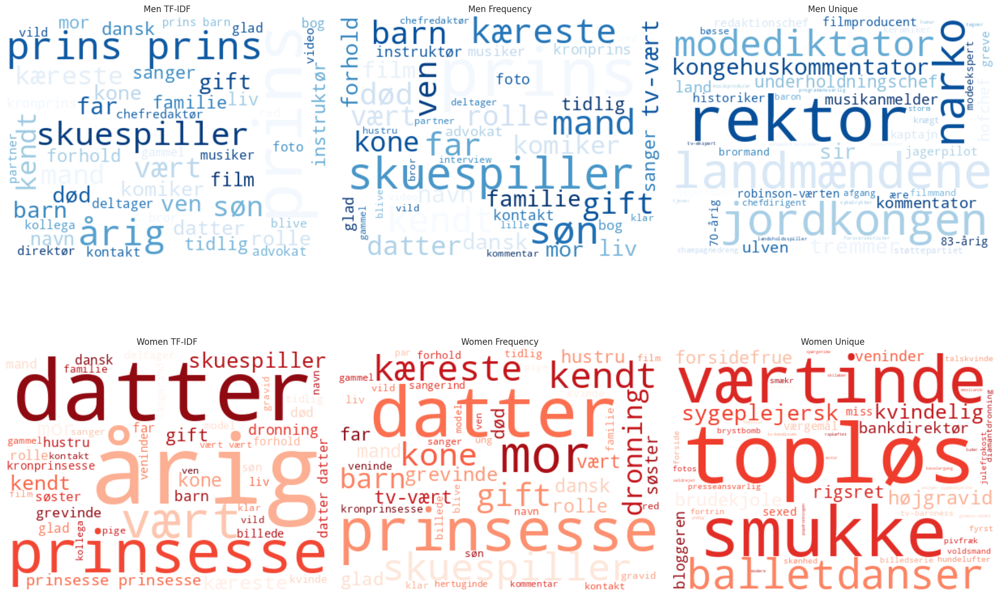

In [59]:

# Sample 500 men and 500 women with seed 2
men_sample = names_df[names_df['gender'] == 'male']
women_sample = names_df[names_df['gender'] == 'female']

# Combine the samples
sampled_df = pd.concat([men_sample, women_sample])

# Print the sampled DataFrame
sampled_df.sort_values(by=['num_articles'], ascending=False)

# Assume sampled_df is already defined with 'canonical_name' and 'person_descriptions'

# Helper to clean and combine descriptions
def preprocess_text(text):
    import re
    text = re.sub(r'[^\wæøåÆØÅ-]', ' ', str(text).lower())
    return ' '.join([w for w in text.split() if len(w) > 2 and not w.isdigit()])

# Build text per person
sampled_df['clean_text'] = sampled_df['person_descriptions'].apply(
    lambda d: preprocess_text(" ".join(sum(d.values(), []))) if isinstance(d, dict) else ""
)

# Split by gender
men_text = " ".join(sampled_df[sampled_df['gender']=='male']['clean_text'])
women_text = " ".join(sampled_df[sampled_df['gender']=='female']['clean_text'])

# Token lists
men_tokens = men_text.split()
women_tokens = women_text.split()

# Frequency counters
men_freq = Counter(men_tokens)
women_freq = Counter(women_tokens)

# Unique words (appear only in that gender)
all_words = set(men_tokens) | set(women_tokens)
word_occ = defaultdict(set)
for w in men_tokens:
    word_occ[w].add('male')
for w in women_tokens:
    word_occ[w].add('female')

men_unique = {w: men_freq[w] for w in men_freq if word_occ[w]=={'male'}}
women_unique = {w: women_freq[w] for w in women_freq if word_occ[w]=={'female'}}

# TF-IDF
vectorizer = TfidfVectorizer(token_pattern=r'\b[^\d\W]{3,}\b', min_df=2,  ngram_range=(1,2))
tfidf = vectorizer.fit_transform([men_text, women_text]).toarray()
terms = vectorizer.get_feature_names_out()
men_tfidf = {terms[i]: tfidf[0,i] for i in tfidf[0].argsort()[::-1][:100] if tfidf[0,i]>0}
women_tfidf = {terms[i]: tfidf[1,i] for i in tfidf[1].argsort()[::-1][:100] if tfidf[1,i]>0}


# Take top N
N = 50
men_tfidf = dict(list(men_tfidf.items())[:N])
women_tfidf = dict(list(women_tfidf.items())[:N])
men_freq_top = dict(men_freq.most_common(N))
women_freq_top = dict(women_freq.most_common(N))
men_unique_top = dict(sorted(men_unique.items(), key=lambda kv: kv[1], reverse=True)[:N])
women_unique_top = dict(sorted(women_unique.items(), key=lambda kv: kv[1], reverse=True)[:N])


#REMOVE DUPLICATES:
from difflib import SequenceMatcher

def remove_similar_words(word_dict, threshold=0.85):
    unique_words = []
    filtered = {}
    for word, score in sorted(word_dict.items(), key=lambda x: -x[1]):
        if all(SequenceMatcher(None, word, w).ratio() < threshold for w in unique_words):
            unique_words.append(word)
            filtered[word] = score
    return filtered

# Apply before plotting
men_tfidf = remove_similar_words(men_tfidf)
women_tfidf = remove_similar_words(women_tfidf)

men_freq_top = remove_similar_words(men_freq_top)
women_freq_top = remove_similar_words(women_freq_top)

men_unique_top = remove_similar_words(men_unique_top)
women_unique_top = remove_similar_words(women_unique_top)


# Plot
fig, axes = plt.subplots(2, 3, figsize=(20, 15))
plot_sets = [
    (men_tfidf,  axes[0][0], "Blues", "Men TF-IDF"),
    (men_freq_top,axes[0][1], "Blues", "Men Frequency"),
    (men_unique_top,axes[0][2], "Blues", "Men Unique"),
    (women_tfidf, axes[1][0], "Reds",  "Women TF-IDF"),
    (women_freq_top,axes[1][1], "Reds", "Women Frequency"),
    (women_unique_top,axes[1][2],"Reds", "Women Unique"),
]

for word_dict, ax, cmap, title in plot_sets:
    ax.set_title(title, fontsize=12)
    ax.axis('off')
    if word_dict:
        wc = WordCloud(width=400, height=300, background_color='white', colormap=cmap)
        wc.generate_from_frequencies(word_dict)
        ax.imshow(wc, interpolation='bilinear')
    else:
        ax.text(0.5, 0.5, "No Data", ha='center', va='center')

plt.tight_layout()
plt.savefig("random-sample-wordcloud.pdf")
plt.show()


#### P-test of offensive langauge

We see that there is indeed a tendency for NSFW langauge against women, is it something thats significant?

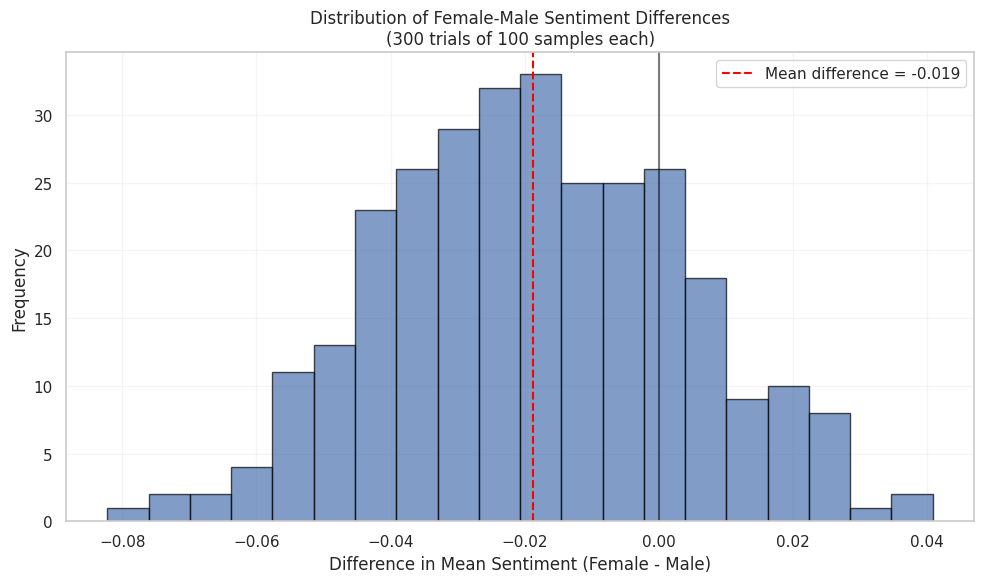


Results:
Average male sentiment across trials: 0.943
Average female sentiment across trials: 0.924

T-test results (H0: no difference between genders):
  t-statistic = -14.544
  p-value = 0.0000
  Mean difference = -0.019 (Female - Male)
  95% Confidence Interval: [-0.060, 0.025]


In [60]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import ttest_1samp
# Number of trials and sample size
n_trials = 300
n_per_gender = 100

# Storage for per-trial averages
avg_male_list = []
avg_female_list = []
diff_list = []

#Problem implemnting the previous article_About_member, so we use greedy assumption that if they are mentioned atleast 3 times, the article will be relevant. 
def article_about_member(article_row, aliases):
    """Check if article is about member using NER clusters."""
    clusters = article_row.get('ner_clusters', [])
    if isinstance(clusters, str):
        try:
            clusters = eval(clusters)
        except:
            clusters = []
    if not isinstance(clusters, (list, tuple, np.ndarray)):
        return False
    alias_count = sum(1 for token in clusters if token in aliases)
    return alias_count >= 3

def compute_avg_sentiment(sampled_df, articles_df):
    male_sents = []
    female_sents = []
    
    for _, person in sampled_df.iterrows():
        gender = person['gender']
        aliases = person['aliases']
        art_ids = person['article_ids']
        
        if isinstance(aliases, str):
            try: 
                aliases = eval(aliases)
            except: 
                aliases = []
        if isinstance(art_ids, str):
            try: 
                art_ids = eval(art_ids)
            except: 
                continue
        
        df_hate = articles_df[articles_df['article_id'].isin(art_ids)].copy()
        df_hate = df_hate[df_hate.apply(lambda row: article_about_member(row, aliases), axis=1)]
        df_hate['sentiment_num'] = df_hate['hate_speech'].map({
            'not offensive': 1, 
            'spam & indhold': 0,
            'personangreb': 0,
            'sprogbrug': 0
        })
        
        scores = df_hate['sentiment_num'].dropna().tolist()
        if gender == 'male':
            male_sents.extend(scores)
        elif gender == 'female':
            female_sents.extend(scores)
    
    avg_m = np.mean(male_sents) if male_sents else np.nan
    avg_f = np.mean(female_sents) if female_sents else np.nan
    return avg_m, avg_f

# Main trial loop
for _ in range(n_trials):
    men_sample = names_df[names_df['gender'] == 'male'].sample(n=n_per_gender)
    women_sample = names_df[names_df['gender'] == 'female'].sample(n=n_per_gender)
    sampled_df = pd.concat([men_sample, women_sample])  # Use pd.concat instead of np.concatenate
    
    avg_m, avg_f = compute_avg_sentiment(sampled_df, df)
    if not np.isnan(avg_m) and not np.isnan(avg_f):  # Only append if both values are valid
        avg_male_list.append(avg_m)
        avg_female_list.append(avg_f)
        diff_list.append(avg_f - avg_m)

# One-sample t-test on the differences (H0: mean diff = 0)
t_stat, p_value = ttest_1samp(diff_list, 0)

# Plot the distribution of differences
plt.figure(figsize=(10, 6))
plt.hist(diff_list, bins=20, edgecolor='black', alpha=0.7)
plt.axvline(np.mean(diff_list), color='red', linestyle='--', 
           label=f"Mean difference = {np.mean(diff_list):.3f}")
plt.axvline(0, color='black', linestyle='-', alpha=0.5)
plt.title(f"Distribution of Female-Male Sentiment Differences\n({n_trials} trials of {n_per_gender} samples each)")
plt.xlabel("Difference in Mean Sentiment (Female - Male)")
plt.ylabel("Frequency")
plt.legend()
plt.grid(alpha=0.2)
plt.tight_layout()
plt.savefig("sentiment-dist-gender.pdf")
plt.show()

# Print results
print("\nResults:")
print(f"Average male sentiment across trials: {np.mean(avg_male_list):.3f}")
print(f"Average female sentiment across trials: {np.mean(avg_female_list):.3f}")
print(f"\nT-test results (H0: no difference between genders):")
print(f"  t-statistic = {t_stat:.3f}")
print(f"  p-value = {p_value:.4f}")
print(f"  Mean difference = {np.mean(diff_list):.3f} (Female - Male)")

# Calculate 95% confidence interval
ci_low = np.percentile(diff_list, 2.5)
ci_high = np.percentile(diff_list, 97.5)
print(f"  95% Confidence Interval: [{ci_low:.3f}, {ci_high:.3f}]")

We can with signifiacne reject the null hypthethis, and confirm the alternative hypothas, that there is indeed differnece between the genders and offensive langauge. 

- Men’s sampled articles are, on average, 94.3% “not offensive.”

- Women’s sampled articles are, on average, 92.1% “not offensive.”

However 2 percent is not that much, it is because its hard to actually generalise offensive langauge using a NLP: 

See for example this. This sentence clearly has NSFW langauge around a women. But its not targeted as "offensive"

In [61]:

# Define keywords of interest
keywords = ["patter"]
pattern = '|'.join(keywords)

# Filter articles that are not offensive and contain one of the keywords in the body
filtered_df = df[
    (df['hate_speech'] == "not offensive") &
    df['body'].str.contains(pattern, case=False, na=False)
]

# Look for person descriptions that include any of the keywords
matching_rows = []
for idx, row in filtered_df.iterrows():
    person_descs = row.get('person_descriptions', {})
    if isinstance(person_descs, str):
        try:
            person_descs = eval(person_descs)
        except:
            continue
    if isinstance(person_descs, dict):
        for person, desc_list in person_descs.items():
            if any(any(kw in desc.lower() for kw in keywords) for desc in desc_list):
                matching_rows.append({

                    "title": row["title"],
                    "person": person,
                    "descriptions": desc_list,

                })

matching_rows[:1]  # Return first match only for brevity


[{'title': 'Victoria Beckham: Gode bryster',
  'person': 'Victoria Beckham',
  'descriptions': ['popstjerne', 'plastikpatter']}]

In english:

Title: Victoria Beckham: Good breats

Descriptions: ['Popstar', 'Plasticboobs']

#### P-test of sentiment

We also saw on previous plots that men typiccaly are in articles with less positive sentiment, is that also a general thing?

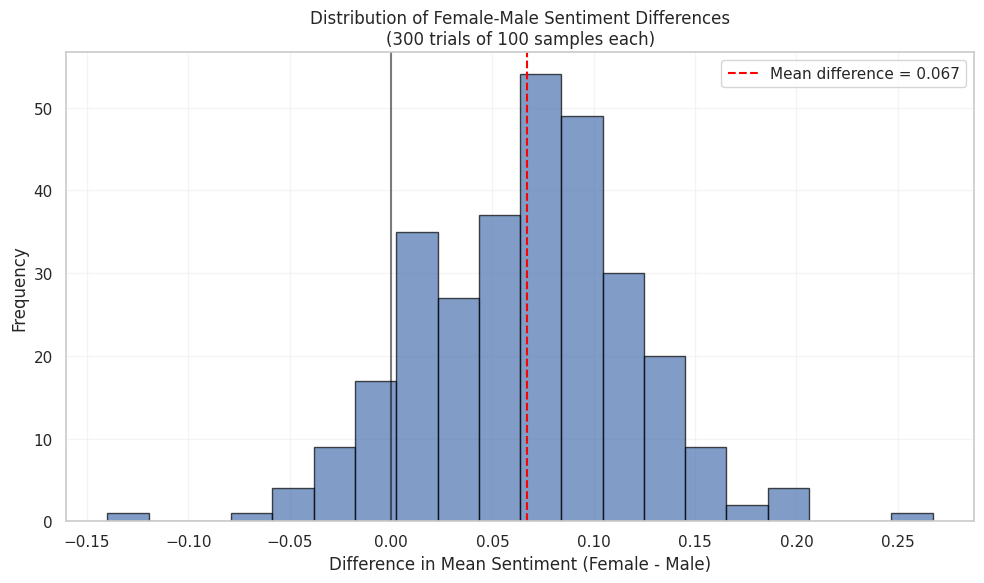


Results:
Average male sentiment across trials: 0.527
Average female sentiment across trials: 0.594

T-test results (H0: no difference between genders):
  t-statistic = 22.083
  p-value = 0.0000
  Mean difference = 0.067 (Female - Male)
  95% Confidence Interval: [-0.034, 0.159]


In [62]:


# Number of trials and sample size
n_trials = 300
n_per_gender = 100

# Storage for per-trial averages
avg_male_list = []
avg_female_list = []
diff_list = []

def article_about_member(article_row, aliases):
    """Check if article is about member using NER clusters."""
    clusters = article_row.get('ner_clusters', [])
    if isinstance(clusters, str):
        try:
            clusters = eval(clusters)
        except:
            clusters = []
    if not isinstance(clusters, (list, tuple, np.ndarray)):
        return False
    alias_count = sum(1 for token in clusters if token in aliases)
    return alias_count >= 3

def compute_avg_sentiment(sampled_df, articles_df):
    male_sents = []
    female_sents = []
    
    for _, person in sampled_df.iterrows():
        gender = person['gender']
        aliases = person['aliases']
        art_ids = person['article_ids']
        
        if isinstance(aliases, str):
            try: 
                aliases = eval(aliases)
            except: 
                aliases = []
        if isinstance(art_ids, str):
            try: 
                art_ids = eval(art_ids)
            except: 
                continue
        
        df = articles_df[articles_df['article_id'].isin(art_ids)].copy()
        df = df[df.apply(lambda row: article_about_member(row, aliases), axis=1)]
        df['sentiment_num'] = df['sentiment_label'].map({
            'positive': 1, 
            'negative': 0,
        })
        
        scores = df['sentiment_num'].dropna().tolist()
        if gender == 'male':
            male_sents.extend(scores)
        elif gender == 'female':
            female_sents.extend(scores)
    
    avg_m = np.mean(male_sents) if male_sents else np.nan
    avg_f = np.mean(female_sents) if female_sents else np.nan
    return avg_m, avg_f

# Main trial loop
for _ in range(n_trials):
    men_sample = names_df[names_df['gender'] == 'male'].sample(n=n_per_gender)
    women_sample = names_df[names_df['gender'] == 'female'].sample(n=n_per_gender)
    sampled_df = pd.concat([men_sample, women_sample])  # Use pd.concat instead of np.concatenate
    
    avg_m, avg_f = compute_avg_sentiment(sampled_df, df)
    if not np.isnan(avg_m) and not np.isnan(avg_f):  # Only append if both values are valid
        avg_male_list.append(avg_m)
        avg_female_list.append(avg_f)
        diff_list.append(avg_f - avg_m)

# One-sample t-test on the differences (H0: mean diff = 0)
t_stat, p_value = ttest_1samp(diff_list, 0)

# Plot the distribution of differences
plt.figure(figsize=(10, 6))
plt.hist(diff_list, bins=20, edgecolor='black', alpha=0.7)
plt.axvline(np.mean(diff_list), color='red', linestyle='--', 
           label=f"Mean difference = {np.mean(diff_list):.3f}")
plt.axvline(0, color='black', linestyle='-', alpha=0.5)
plt.title(f"Distribution of Female-Male Sentiment Differences\n({n_trials} trials of {n_per_gender} samples each)")
plt.xlabel("Difference in Mean Sentiment (Female - Male)")
plt.ylabel("Frequency")
plt.legend()
plt.grid(alpha=0.2)
plt.tight_layout()
plt.savefig("sentiment-ment-dist.pdf")
plt.show()

# Print results
print("\nResults:")
print(f"Average male sentiment across trials: {np.mean(avg_male_list):.3f}")
print(f"Average female sentiment across trials: {np.mean(avg_female_list):.3f}")
print(f"\nT-test results (H0: no difference between genders):")
print(f"  t-statistic = {t_stat:.3f}")
print(f"  p-value = {p_value:.4f}")
print(f"  Mean difference = {np.mean(diff_list):.3f} (Female - Male)")

# Calculate 95% confidence interval
ci_low = np.percentile(diff_list, 2.5)
ci_high = np.percentile(diff_list, 97.5)
print(f"  95% Confidence Interval: [{ci_low:.3f}, {ci_high:.3f}]")

We can with significance reject the null hypothethis, and confirm the alternative hypothas, that there is indeed differnece between the genders and sentiment value. 

_____


**Discussion**



Our analysis revealed some tendecy towards gender-specific language patterns, particularly through the TF-IDF metrics. Among these the TF-Unique metrics proved most effective in highlighting differences between how men and women are described. This was especially evident in the use of sexualized or appearance-focused language in the womens part of the wordcloud. In contrast, standard TF-IDF and TF measures were less effective in capturing such nuances and were better at describing common words for the community. 

However, other NLP-based features such as sentiment analysis, emotion detection, and hate speech classification were less consistent in identifying strong or systematic gender bias. While we did observe statistically significant differences (for example women were associated with slightly more positive sentiment and slightly higher levels of offensive language), the magnitude of these effects was relatively small, typically under 5 percent. and while the statistical test using random sampling did show signifacnt difference its hard to conclude anything given the current NLP methods.

It is also important to recognize the limitations of relying primarily on TF-IDF for conclusions about bias. These metrics reflect surface-level word frequency rather than context or intent. A more robust approach, such as training machine learning models specifically to detect biased framing or implicit stereotypes, could give deeper insights. However, due to licensing restrictions on the EB-NeRD dataset (which prohibits training models on the text), developing such a model would require access to a different dataset.


____

**Conclusion** There is indeed a tendency towards gender-specific langauge. Some is trivial such as "dad", "mom" and other titltes typicaly associated with gender. However our analysis also showed that women were more prone to NSFW words, but are spoken more positive about in terms of sentiment. Whereas men are typiccaly in articles with more negative sentiment. The distribution of emotions of articles seems to be equally distributed between the genders. 

____